In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import joblib
import statsmodels.api as sm
import patsy
import scipy.stats as stats
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV, ElasticNet, ElasticNetCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

pd.set_option('display.max_columns', 75)
pd.set_option('display.max_rows', 100)

In [ ]:
with open("playerDB.csv", "r") as file:
    lines = file.readlines()

# Print line 83 to see its content
print(lines[82])  # Assuming line numbers start from 0

UnicodeDecodeError: 'utf-8' codec can't decode byte 0xe7 in position 799: invalid continuation byte

# Data Analysis & cleaning


In [ ]:
import pandas as pd

# Specify the encoding when reading the CSV file
playerDF = pd.read_csv("playerDB.csv", delimiter=';',encoding='latin-1')


# Print the first few rows to verify the data
playerDF.head()


,name,Age,Overall rating,Potential,Team & Contract,ID,Height,Weight,foot,Best overall,...,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace
0,S. Szyma?ski CAM,24,80.0,84.0,Fenerbahçe\n2023 ~ 2027,235973,"174cm / 5'9""",60kg,Left,82,...,14,14,2027,423,1,81,77,78,79,51
1,A. Diao Diaoune RM LM,17,70.0,86.0,Real Betis\n2022 ~ 2024,275324,"185cm / 6'1""",72kg,Right,71,...,8,11,1711,372,1,84,69,60,73,30
2,A. Obando ST,17,66.0,85.0,Barcelona Guayaquil\n2023 ~ 2025,278856,"188cm / 6'2""",79kg,Right,68,...,12,13,1582,338,1,69,61,48,65,29
3,V. Gyökeres ST,25,79.0,84.0,Sporting CP\n2023 ~ 2028,241651,"187cm / 6'2""",90kg,Right,81,...,14,8,1970,425,1,82,77,66,77,35
4,K. Mainoo CDM CM,18,70.0,86.0,Manchester United\n2022 ~ 2027,269136,"184cm / 6'0""",80kg,Right,71,...,5,9,1892,408,1,74,58,66,73,68


In [ ]:
playerDF.columns

Index(['name', 'Age', 'Overall rating', 'Potential', 'Team & Contract', 'ID',
       'Height', 'Weight', 'foot', 'Best overall', 'Best position', 'Growth',
       'Value', 'Wage', 'Release clause', 'Total attacking', 'Crossing',
       'Finishing', 'Heading accuracy', 'Short passing', 'Volleys',
       'Total skill', 'Dribbling', 'Curve', 'FK Accuracy', 'Long passing',
       'Ball control', 'Total movement', 'Acceleration', 'Sprint speed',
       'Agility', 'Reactions', 'Balance', 'Total power', 'Shot power',
       'Jumping', 'Stamina', 'Strength', 'Long shots', 'Total mentality',
       'Aggression', 'Interceptions', 'Att. Position', 'Vision', 'Penalties',
       'Composure', 'Total defending', 'Defensive awareness',
       'Standing tackle', 'Sliding tackle', 'Total goalkeeping', 'GK Diving',
       'GK Handling', 'GK Kicking', 'GK Positioning', 'GK Reflexes',
       'Total stats', 'Base stats', 'International reputation',
       'Pace / Diving', 'Shooting / Handling', 'Passing / K

In [ ]:
playerDF.describe()

,Age,Overall rating,Potential,ID,Best overall,Growth,Total attacking,Crossing,Finishing,Heading accuracy,...,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace
count,3120.000000,3108.000000,3108.000000,3120.000000,3120.000000,3120.000000,3120.000000,3116.000000,3115.000000,3115.000000,...,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000,3120.000000
mean,23.761218,72.468468,78.824968,241565.927885,73.707372,6.345833,288.197756,57.503209,55.265811,57.019583,...,14.155128,14.458013,1782.583013,391.683333,1.381090,73.184295,60.666667,65.080128,70.898077,53.970513
std,4.456879,6.857272,5.340145,31074.861142,6.684859,5.627016,70.592897,17.486661,20.063210,16.983272,...,15.778656,16.425163,253.998588,38.960816,0.757962,10.202676,14.215798,9.602019,8.597135,17.962907
min,16.000000,47.000000,54.000000,41.000000,49.000000,0.000000,48.000000,8.000000,4.000000,5.000000,...,2.000000,2.000000,780.000000,253.000000,1.000000,31.000000,21.000000,33.000000,35.000000,15.000000
25%,20.000000,68.000000,76.000000,231856.000000,69.000000,1.000000,262.000000,49.000000,42.500000,48.000000,...,8.000000,8.000000,1650.000000,363.000000,1.000000,67.000000,52.000000,58.000000,65.000000,38.000000
50%,23.000000,73.000000,79.000000,246199.000000,74.000000,5.000000,299.000000,62.000000,60.000000,59.000000,...,10.000000,10.000000,1814.500000,395.000000,1.000000,74.000000,63.000000,66.000000,72.000000,58.000000
75%,26.000000,77.000000,82.000000,261455.000000,78.000000,10.000000,334.000000,70.000000,71.000000,69.000000,...,13.000000,13.000000,1955.250000,420.000000,1.000000,80.000000,71.000000,72.000000,77.000000,69.000000
max,44.000000,91.000000,94.000000,279623.000000,93.000000,26.000000,440.000000,95.000000,96.000000,93.000000,...,88.000000,91.000000,2330.000000,499.000000,5.000000,97.000000,93.000000,94.000000,94.000000,89.000000


In [ ]:
playerDF.shape

(3120, 64)

In [ ]:
any_null =playerDF.isnull()
sumnull =playerDF.isnull().sum()
percent = missing_percentage = (playerDF.isnull().sum() / len(playerDF)) * 100

In [ ]:
print(sumnull)

name                     0
Age                      0
Overall rating          12
Potential               12
Team & Contract          0
                        ..
Pace / Diving            0
Shooting / Handling      0
Passing / Kicking        0
Dribbling / Reflexes     0
Defending / Pace         0
Length: 64, dtype: int64


In [ ]:
print(percent)

name                    0.000000
Age                     0.000000
Overall rating          0.384615
Potential               0.384615
Team & Contract         0.000000
                          ...   
Pace / Diving           0.000000
Shooting / Handling     0.000000
Passing / Kicking       0.000000
Dribbling / Reflexes    0.000000
Defending / Pace        0.000000
Length: 64, dtype: float64


In [ ]:
any_null

,name,Age,Overall rating,Potential,Team & Contract,ID,Height,Weight,foot,Best overall,...,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3115,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3116,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3117,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3118,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
missing_data  =playerDF[playerDF['Overall rating'].isnull() | playerDF['Potential'].isnull()]

missing_data

,name,Age,Overall rating,Potential,Team & Contract,ID,Height,Weight,foot,Best overall,...,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace
804,A. Diallo CB LB,27,NaN,NaN,Paris Saint Germain\n2019 ~ 2024,225711,"187cm / 6'2""",79kg,Left,78,...,7,8,1875,406,2,68,39,70,75,78
1113,S. Hezze CDM CM,21,NaN,83.0,Huracán\n2020 ~ 2024,255971,"182cm / 6'0""",77kg,Right,76,...,14,7,1917,415,1,67,62,67,71,72
1225,M. Verratti CM CDM,30,NaN,NaN,Paris Saint Germain\n2012 ~ 2026,199556,"165cm / 5'5""",60kg,Right,86,...,15,10,2176,441,3,57,61,87,91,79
1560,23 A. Taarabt CM CAM,33,NaN,NaN,Benfica\n2015 ~ 2023,179605,"181cm / 5'11""",77kg,Right,77,...,4,6,1990,427,2,66,69,75,84,64
1578,P. Pogba CM CDM,30,NaN,NaN,Juventus\n2022 ~ 2026,195864,"191cm / 6'3""",84kg,Right,82,...,4,3,2147,451,4,65,78,84,84,62
1649,F. González CAM CM CF,19,NaN,79.0,Danubio\n2022 ~ 2025,273661,"165cm / 5'5""",60kg,Right,69,...,11,5,1687,364,1,79,59,63,71,36
1742,23 T. Borbas ST RW,20,NaN,NaN,River Plate\n2020 ~ 2023,255786,"185cm / 6'1""",79kg,Right,74,...,8,14,1706,359,1,80,72,54,66,24
2253,23 A. Taarabt CM CAM,33,NaN,NaN,Benfica\n2015 ~ 2023,179605,"181cm / 5'11""",77kg,Right,77,...,4,6,1990,427,2,66,69,75,84,64
2432,Simo CB,18,65.0,NaN,Espanyol\n2022 ~ 2026,270051,"188cm / 6'2""",80kg,Right,67,...,9,15,1526,334,1,59,38,51,55,65
2556,M. Camara CM,20,NaN,NaN,Lens\n2021 ~ 2024,263459,"185cm / 6'1""",73kg,Left,65,...,9,9,1504,325,1,48,45,59,61,57


In [ ]:
playerDF = playerDF.dropna()

In [ ]:
playerDF.isnull().sum()

name                    0
Age                     0
Overall rating          0
Potential               0
Team & Contract         0
                       ..
Pace / Diving           0
Shooting / Handling     0
Passing / Kicking       0
Dribbling / Reflexes    0
Defending / Pace        0
Length: 64, dtype: int64

In [ ]:
playerDF.dtypes

name                     object
Age                       int64
Overall rating          float64
Potential               float64
Team & Contract          object
                         ...   
Pace / Diving             int64
Shooting / Handling       int64
Passing / Kicking         int64
Dribbling / Reflexes      int64
Defending / Pace          int64
Length: 64, dtype: object

In [ ]:
dtypes_dict = playerDF.dtypes.to_dict()
print(dtypes_dict)

{'name': dtype('O'), 'Age': dtype('int64'), 'Overall rating': dtype('float64'), 'Potential': dtype('float64'), 'Team & Contract': dtype('O'), 'ID': dtype('int64'), 'Height': dtype('O'), 'Weight': dtype('O'), 'foot': dtype('O'), 'Best overall': dtype('int64'), 'Best position': dtype('O'), 'Growth': dtype('int64'), 'Value': dtype('O'), 'Wage': dtype('O'), 'Release clause': dtype('O'), 'Total attacking': dtype('int64'), 'Crossing': dtype('float64'), 'Finishing': dtype('float64'), 'Heading accuracy': dtype('float64'), 'Short passing': dtype('float64'), 'Volleys': dtype('int64'), 'Total skill': dtype('int64'), 'Dribbling': dtype('float64'), 'Curve': dtype('float64'), 'FK Accuracy': dtype('int64'), 'Long passing': dtype('float64'), 'Ball control': dtype('float64'), 'Total movement': dtype('int64'), 'Acceleration': dtype('float64'), 'Sprint speed': dtype('float64'), 'Agility': dtype('float64'), 'Reactions': dtype('float64'), 'Balance': dtype('float64'), 'Total power': dtype('int64'), 'Shot po

In [ ]:
#playerDF.loc[:, 'Value'] = playerDF['Value']

In [ ]:
playerDF['Value']

0        30M
1         4M
2       2.1M
3        26M
4       3.8M
        ...  
3115       0
3116      4M
3117    180K
3118     13M
3119    2.9M
Name: Value, Length: 3097, dtype: object

In [ ]:
first_char_of_first_row =  playerDF['Value'].iloc[0][1:-1]

In [ ]:
# Prefix conversion for player value
def stringToFloat(value):
    float_str = ""
    times = 1  # Initialize times as an integer
    for char in value:
        if char == "M":
            times = 1000000  # Multiply by 1 million for 'M'
        elif char == "K":
            times = 1000  # Multiply by 1 thousand for 'K'
        elif char.isdigit() or char == ".":
            float_str += char
    return float(float_str) * times if float_str else None


In [ ]:
first_char_of_first_row

'30'

In [ ]:
playerDF.loc[:,'Value'] = playerDF['Value'].apply(stringToFloat)

In [ ]:
playerDF['Value']

0       30000000.0
1        4000000.0
2        2100000.0
3       26000000.0
4        3800000.0
           ...    
3115           0.0
3116     4000000.0
3117      180000.0
3118    13000000.0
3119     2900000.0
Name: Value, Length: 3097, dtype: object

In [ ]:
playerDF['Value'] = pd.to_numeric(playerDF['Value'], errors='coerce')




In [ ]:
playerDF['Value'].dtype

dtype('float64')

In [ ]:
print(playerDF.info())

<class 'pandas.core.frame.DataFrame'>
Index: 3097 entries, 0 to 3119
Data columns (total 64 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   name                      3097 non-null   object 
 1   Age                       3097 non-null   int64  
 2   Overall rating            3097 non-null   float64
 3   Potential                 3097 non-null   float64
 4   Team & Contract           3097 non-null   object 
 5   ID                        3097 non-null   int64  
 6   Height                    3097 non-null   object 
 7   Weight                    3097 non-null   object 
 8   foot                      3097 non-null   object 
 9   Best overall              3097 non-null   int64  
 10  Best position             3097 non-null   object 
 11  Growth                    3097 non-null   int64  
 12  Value                     3097 non-null   float64
 13  Wage                      3097 non-null   object 
 14  Release claus

In [ ]:
#playerDF['Height'] = playerDF['Height'].apply(stringToFloat)

In [ ]:
print(playerDF.info())

<class 'pandas.core.frame.DataFrame'>
Index: 3097 entries, 0 to 3119
Data columns (total 64 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   name                      3097 non-null   object 
 1   Age                       3097 non-null   int64  
 2   Overall rating            3097 non-null   float64
 3   Potential                 3097 non-null   float64
 4   Team & Contract           3097 non-null   object 
 5   ID                        3097 non-null   int64  
 6   Height                    3097 non-null   object 
 7   Weight                    3097 non-null   object 
 8   foot                      3097 non-null   object 
 9   Best overall              3097 non-null   int64  
 10  Best position             3097 non-null   object 
 11  Growth                    3097 non-null   int64  
 12  Value                     3097 non-null   float64
 13  Wage                      3097 non-null   object 
 14  Release claus

In [ ]:
print(playerDF['Height'])

0       174cm / 5'9"
1       185cm / 6'1"
2       188cm / 6'2"
3       187cm / 6'2"
4       184cm / 6'0"
            ...     
3115    171cm / 5'7"
3116    193cm / 6'4"
3117    183cm / 6'0"
3118    185cm / 6'1"
3119    188cm / 6'2"
Name: Height, Length: 3097, dtype: object


In [ ]:
playerDF['Release clause'] = playerDF['Release clause'].apply(stringToFloat)


In [ ]:
playerDF['Wage'] = playerDF['Wage'].apply(stringToFloat)


In [ ]:
print(playerDF['Release clause'])

0       59300000.0
1       10900000.0
2        5900000.0
3       54000000.0
4        9600000.0
           ...    
3115           0.0
3116     8400000.0
3117      311000.0
3118    25700000.0
3119     6700000.0
Name: Release clause, Length: 3097, dtype: float64


In [ ]:
playerDF['Weight'] = playerDF['Weight'].apply(stringToFloat)

In [ ]:
print(playerDF[['Weight', 'Wage', 'Release clause']].info())

<class 'pandas.core.frame.DataFrame'>
Index: 3097 entries, 0 to 3119
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Weight          3097 non-null   float64
 1   Wage            3097 non-null   float64
 2   Release clause  3097 non-null   float64
dtypes: float64(3)
memory usage: 96.8 KB
None


In [ ]:
print(playerDF['Wage'])

0       36000.0
1        2000.0
2         500.0
3       18000.0
4       13000.0
         ...   
3115        0.0
3116    19000.0
3117     3000.0
3118    31000.0
3119    10000.0
Name: Wage, Length: 3097, dtype: float64


In [ ]:
playerDF['Height'] = playerDF['Height'].apply(stringToFloat)

In [ ]:
playerDF['Height'] = playerDF['Height'] / 100

In [ ]:
playerDF['Height']

0       174.59
1       185.61
2       188.62
3       187.62
4       184.60
         ...  
3115    171.57
3116    193.64
3117    183.60
3118    185.61
3119    188.62
Name: Height, Length: 3097, dtype: float64

In [ ]:
playerDF['Weight']

0       60.0
1       72.0
2       79.0
3       90.0
4       80.0
        ... 
3115    64.0
3116    78.0
3117    80.0
3118    78.0
3119    79.0
Name: Weight, Length: 3097, dtype: float64

In [ ]:
print(playerDF.info())

<class 'pandas.core.frame.DataFrame'>
Index: 3097 entries, 0 to 3119
Data columns (total 64 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   name                      3097 non-null   object 
 1   Age                       3097 non-null   int64  
 2   Overall rating            3097 non-null   float64
 3   Potential                 3097 non-null   float64
 4   Team & Contract           3097 non-null   object 
 5   ID                        3097 non-null   int64  
 6   Height                    3097 non-null   float64
 7   Weight                    3097 non-null   float64
 8   foot                      3097 non-null   object 
 9   Best overall              3097 non-null   int64  
 10  Best position             3097 non-null   object 
 11  Growth                    3097 non-null   int64  
 12  Value                     3097 non-null   float64
 13  Wage                      3097 non-null   float64
 14  Release claus

In [ ]:
playerDF.head()

,name,Age,Overall rating,Potential,Team & Contract,ID,Height,Weight,foot,Best overall,...,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace
0,S. Szyma?ski CAM,24,80.0,84.0,Fenerbahçe\n2023 ~ 2027,235973,174.59,60.0,Left,82,...,14,14,2027,423,1,81,77,78,79,51
1,A. Diao Diaoune RM LM,17,70.0,86.0,Real Betis\n2022 ~ 2024,275324,185.61,72.0,Right,71,...,8,11,1711,372,1,84,69,60,73,30
2,A. Obando ST,17,66.0,85.0,Barcelona Guayaquil\n2023 ~ 2025,278856,188.62,79.0,Right,68,...,12,13,1582,338,1,69,61,48,65,29
3,V. Gyökeres ST,25,79.0,84.0,Sporting CP\n2023 ~ 2028,241651,187.62,90.0,Right,81,...,14,8,1970,425,1,82,77,66,77,35
4,K. Mainoo CDM CM,18,70.0,86.0,Manchester United\n2022 ~ 2027,269136,184.60,80.0,Right,71,...,5,9,1892,408,1,74,58,66,73,68


In [ ]:
playerDF.rename(columns ={'Team & Contract': 'Team'}, inplace=True)

In [ ]:
playerDF['Team']

0                Fenerbahçe\n2023 ~ 2027
1                Real Betis\n2022 ~ 2024
2       Barcelona Guayaquil\n2023 ~ 2025
3               Sporting CP\n2023 ~ 2028
4         Manchester United\n2022 ~ 2027
                      ...               
3115                        Mexico\nFree
3116                 Monaco\n2020 ~ 2024
3117               Al Batin\n2011 ~ 2021
3118            Galatasaray\n2021 ~ 2026
3119         Rayo Vallecano\n2022 ~ 2026
Name: Team, Length: 3097, dtype: object

In [ ]:
playerDF['Team'] = playerDF['Team'].str.split('\n').str[0]

In [ ]:
playerDF['Team']

0                Fenerbahçe
1                Real Betis
2       Barcelona Guayaquil
3               Sporting CP
4         Manchester United
               ...         
3115                 Mexico
3116                 Monaco
3117               Al Batin
3118            Galatasaray
3119         Rayo Vallecano
Name: Team, Length: 3097, dtype: object

In [ ]:
playerDF.head()

,name,Age,Overall rating,Potential,Team,ID,Height,Weight,foot,Best overall,...,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace
0,S. Szyma?ski CAM,24,80.0,84.0,Fenerbahçe,235973,174.59,60.0,Left,82,...,14,14,2027,423,1,81,77,78,79,51
1,A. Diao Diaoune RM LM,17,70.0,86.0,Real Betis,275324,185.61,72.0,Right,71,...,8,11,1711,372,1,84,69,60,73,30
2,A. Obando ST,17,66.0,85.0,Barcelona Guayaquil,278856,188.62,79.0,Right,68,...,12,13,1582,338,1,69,61,48,65,29
3,V. Gyökeres ST,25,79.0,84.0,Sporting CP,241651,187.62,90.0,Right,81,...,14,8,1970,425,1,82,77,66,77,35
4,K. Mainoo CDM CM,18,70.0,86.0,Manchester United,269136,184.60,80.0,Right,71,...,5,9,1892,408,1,74,58,66,73,68


In [ ]:
playerDF.loc[:,'Position'] = playerDF['name'].str.split(" ").str[-1]
playerDF.loc[:,'name'] = playerDF['name'].str.split(" ").str[0:-1]


In [ ]:
playerDF.head()

,name,Age,Overall rating,Potential,Team,ID,Height,Weight,foot,Best overall,...,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,Position
0,"[S., Szyma?ski]",24,80.0,84.0,Fenerbahçe,235973,174.59,60.0,Left,82,...,14,2027,423,1,81,77,78,79,51,CAM
1,"[A., Diao, Diaoune, RM]",17,70.0,86.0,Real Betis,275324,185.61,72.0,Right,71,...,11,1711,372,1,84,69,60,73,30,LM
2,"[A., Obando]",17,66.0,85.0,Barcelona Guayaquil,278856,188.62,79.0,Right,68,...,13,1582,338,1,69,61,48,65,29,ST
3,"[V., Gyökeres]",25,79.0,84.0,Sporting CP,241651,187.62,90.0,Right,81,...,8,1970,425,1,82,77,66,77,35,ST
4,"[K., Mainoo, CDM]",18,70.0,86.0,Manchester United,269136,184.60,80.0,Right,71,...,9,1892,408,1,74,58,66,73,68,CM


In [ ]:
#playerDF['name'] = ' '.join(playerDF['name'].astype(str))


In [ ]:
playerDF['name'] = playerDF['name'].apply(lambda x: ''.join(x[:2]))

In [ ]:
playerDF['name']

0       S.Szyma?ski
1            A.Diao
2          A.Obando
3        V.Gyökeres
4          K.Mainoo
           ...     
3115    C.Rodríguez
3116      R.Majecki
3117        19 J.Al
3118      V.Nelsson
3119        A.Mumin
Name: name, Length: 3097, dtype: object

In [ ]:
playerDF.shape

(3097, 65)

In [ ]:
playerDF.nlargest(10, columns = "Value")

,name,Age,Overall rating,Potential,Team,ID,Height,Weight,foot,Best overall,...,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,Position
50,E.Haaland,22,91.0,94.0,Manchester City,239085,195.65,94.0,Left,93,...,7,2158,461,5,89,93,66,80,45,ST
114,E.Haaland,22,91.0,94.0,Manchester City,239085,195.65,94.0,Left,93,...,7,2158,461,5,89,93,66,80,45,ST
23,K.Mbappé,24,91.0,94.0,Paris Saint Germain,231747,182.60,75.0,Right,93,...,6,2204,473,5,97,90,80,92,36,LW
83,K.Mbappé,24,91.0,94.0,Paris Saint Germain,231747,182.60,75.0,Right,93,...,6,2204,473,5,97,90,80,92,36,LW
169,ViniJr.,22,89.0,94.0,Real Madrid,238794,176.59,73.0,Right,89,...,10,2028,443,5,95,82,78,90,29,ST
182,ViniJr.,22,89.0,94.0,Real Madrid,238794,176.59,73.0,Right,89,...,10,2028,443,5,95,82,78,90,29,ST
44,J.Musiala,20,86.0,93.0,FC Bayern München,256790,184.60,72.0,Right,88,...,11,2090,451,3,85,75,76,91,63,LM
103,J.Musiala,20,86.0,93.0,FC Bayern München,256790,184.60,72.0,Right,88,...,11,2090,451,3,85,75,76,91,63,LM
226,F.Valverde,24,88.0,92.0,Real Madrid,239053,182.60,78.0,Right,90,...,8,2291,499,3,88,81,84,84,80,RW
249,F.Valverde,24,88.0,92.0,Real Madrid,239053,182.60,78.0,Right,90,...,8,2291,499,3,88,81,84,84,80,RW


In [ ]:
duplicate_rows = playerDF[playerDF.duplicated()]

# Display the number of duplicate rows
print("Number of duplicate rows:", duplicate_rows.shape[0])

Number of duplicate rows: 469


In [ ]:
playerDF = playerDF.drop_duplicates()



# Optionally, reset index if needed
playerDF.reset_index(drop=True, inplace=True)

In [ ]:
print("Number of duplicate rows:", playerDF[playerDF.duplicated()])

Number of duplicate rows: Empty DataFrame
Columns: [name, Age, Overall rating, Potential, Team, ID, Height, Weight, foot, Best overall, Best position, Growth, Value, Wage, Release clause, Total attacking, Crossing, Finishing, Heading accuracy, Short passing, Volleys, Total skill, Dribbling, Curve, FK Accuracy, Long passing, Ball control, Total movement, Acceleration, Sprint speed, Agility, Reactions, Balance, Total power, Shot power, Jumping, Stamina, Strength, Long shots, Total mentality, Aggression, Interceptions, Att. Position, Vision, Penalties, Composure, Total defending, Defensive awareness, Standing tackle, Sliding tackle, Total goalkeeping, GK Diving, GK Handling, GK Kicking, GK Positioning, GK Reflexes, Total stats, Base stats, International reputation, Pace / Diving, Shooting / Handling, Passing / Kicking, Dribbling / Reflexes, Defending / Pace, Position]
Index: []

[0 rows x 65 columns]


In [ ]:
playerDF.head()

,name,Age,Overall rating,Potential,Team,ID,Height,Weight,foot,Best overall,...,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,Position
0,S.Szyma?ski,24,80.0,84.0,Fenerbahçe,235973,174.59,60.0,Left,82,...,14,2027,423,1,81,77,78,79,51,CAM
1,A.Diao,17,70.0,86.0,Real Betis,275324,185.61,72.0,Right,71,...,11,1711,372,1,84,69,60,73,30,LM
2,A.Obando,17,66.0,85.0,Barcelona Guayaquil,278856,188.62,79.0,Right,68,...,13,1582,338,1,69,61,48,65,29,ST
3,V.Gyökeres,25,79.0,84.0,Sporting CP,241651,187.62,90.0,Right,81,...,8,1970,425,1,82,77,66,77,35,ST
4,K.Mainoo,18,70.0,86.0,Manchester United,269136,184.60,80.0,Right,71,...,9,1892,408,1,74,58,66,73,68,CM


In [ ]:
playerDF.shape

(2628, 65)

In [ ]:
sorted_playerDF = playerDF.sort_values(by='Value', ascending=False)


In [ ]:

playerDF.nlargest(10, columns="Value")

,name,Age,Overall rating,Potential,Team,ID,Height,Weight,foot,Best overall,...,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,Position
50,E.Haaland,22,91.0,94.0,Manchester City,239085,195.65,94.0,Left,93,...,7,2158,461,5,89,93,66,80,45,ST
23,K.Mbappé,24,91.0,94.0,Paris Saint Germain,231747,182.60,75.0,Right,93,...,6,2204,473,5,97,90,80,92,36,LW
109,ViniJr.,22,89.0,94.0,Real Madrid,238794,176.59,73.0,Right,89,...,10,2028,443,5,95,82,78,90,29,ST
44,J.Musiala,20,86.0,93.0,FC Bayern München,256790,184.60,72.0,Right,88,...,11,2090,451,3,85,75,76,91,63,LM
164,F.Valverde,24,88.0,92.0,Real Madrid,239053,182.60,78.0,Right,90,...,8,2291,499,3,88,81,84,84,80,RW
17,J.Bellingham,20,88.0,92.0,Real Madrid,252371,186.61,75.0,Right,90,...,8,2282,490,4,80,82,81,87,78,CM
258,RodriCDM,27,90.0,91.0,Manchester City,231866,191.63,82.0,Right,90,...,8,2254,476,4,62,77,84,82,86,CM
129,H.Kane,29,90.0,90.0,FC Bayern München,202126,188.62,85.0,Right,90,...,11,2225,461,5,69,93,84,83,49,ST
57,F.Wirtz,20,87.0,92.0,Bayer 04 Leverkusen,256630,1775.10,71.0,Right,89,...,10,2085,442,3,80,76,86,87,50,CAM
184,L.Martínez,25,88.0,90.0,Inter,231478,174.59,72.0,Right,89,...,13,2184,457,3,80,86,71,87,48,ST


In [ ]:
import numpy as np
import pandas as pd

# Define the small positive value to add to the data
epsilon = 1e-8  # You can adjust this value as needed

# Define the variables for the radar chart
variables = ['Value','Total attacking', 'Crossing', 'Finishing', 'Heading accuracy', 'Short passing', 'Volleys',
             'Total skill', 'Dribbling', 'Curve', 'FK Accuracy', 'Long passing', 'Ball control',
             'Total movement', 'Acceleration', 'Sprint speed', 'Agility', 'Reactions', 'Balance',
             'Total power', 'Shot power', 'Jumping', 'Stamina', 'Strength', 'Long shots',
             'Total mentality', 'Aggression', 'Interceptions', 'Att. Position', 'Vision', 'Penalties',
             'Composure', 'Total defending', 'Defensive awareness', 'Standing tackle', 'Sliding tackle']

# Replace zero or negative values with a small positive value
playerDF[variables] = playerDF[variables].map(lambda x: x if x > 0 else epsilon)

# Take the logarithm of each variable
log_data = np.log(playerDF[variables])

# Create a new DataFrame with the normalized data
log_df = pd.concat([playerDF['name'], log_data], axis=1)

# Display the first few rows of the log DataFrame
print(log_df.head())


          name      Value  Total attacking  Crossing  Finishing  \
0  S.Szyma?ski  17.216708         5.866468  4.356709   4.356709   
1       A.Diao  15.201805         5.683580  4.143135   4.290459   
2     A.Obando  14.557448         5.624018  3.218876   4.219508   
3   V.Gyökeres  17.073607         5.886104  4.110874   4.406719   
4     K.Mainoo  15.150512         5.717028  3.988984   4.077537   

   Heading accuracy  Short passing   Volleys  Total skill  Dribbling  ...  \
0          4.060443       4.369448  4.094345     5.961005   4.343805  ...   
1          3.713572       4.127134  4.007333     5.739793   4.262680  ...   
2          4.317488       4.043051  3.951244     5.501258   4.158883  ...   
3          4.317488       4.276666  4.248495     5.823046   4.382027  ...   
4          4.158883       4.317488  3.951244     5.755742   4.304065  ...   

   Aggression  Interceptions  Att. Position    Vision  Penalties  Composure  \
0    4.158883       3.688879       4.418841  4.382027  

In [ ]:
log_df.shape

(2628, 37)

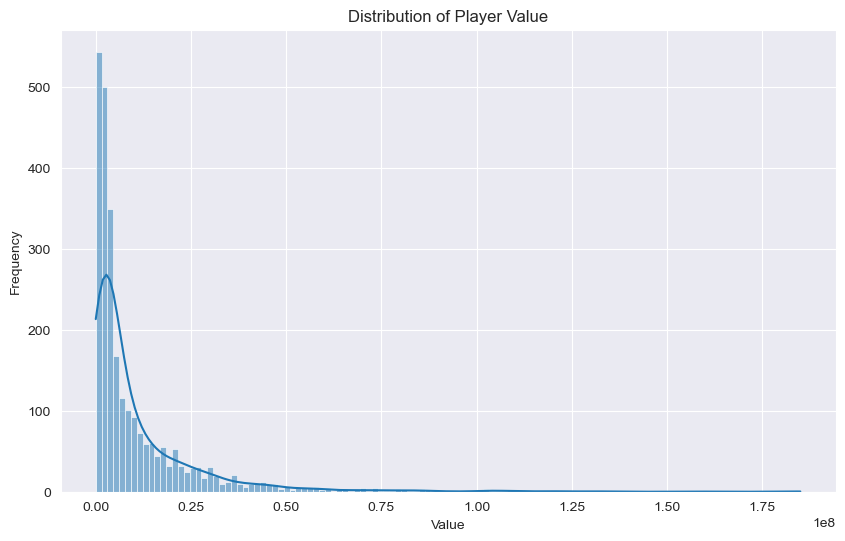

In [ ]:


import seaborn as sns
import matplotlib.pyplot as plt

# Plot the distribution of 'Value' using a histogram
plt.figure(figsize=(10, 6))
sns.histplot(playerDF['Value'], kde=True)
plt.title('Distribution of Player Value')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()



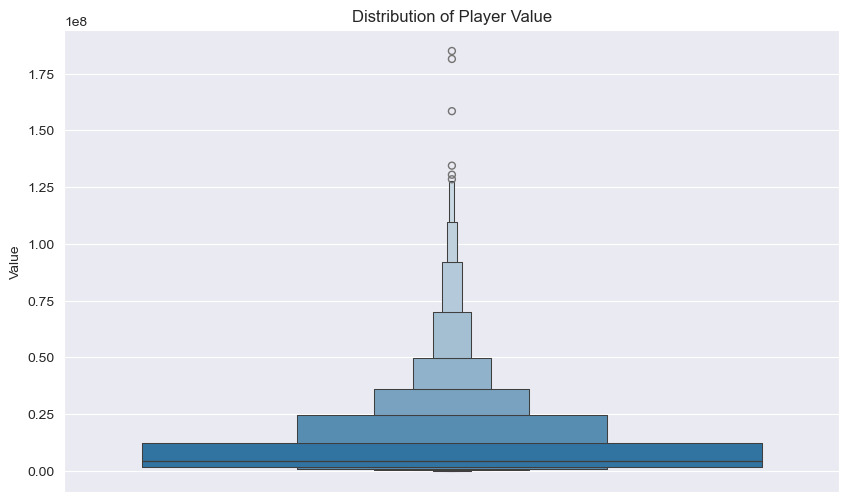

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxenplot(data=playerDF, y='Value')
plt.title('Distribution of Player Value')
plt.ylabel('Value')
plt.show()

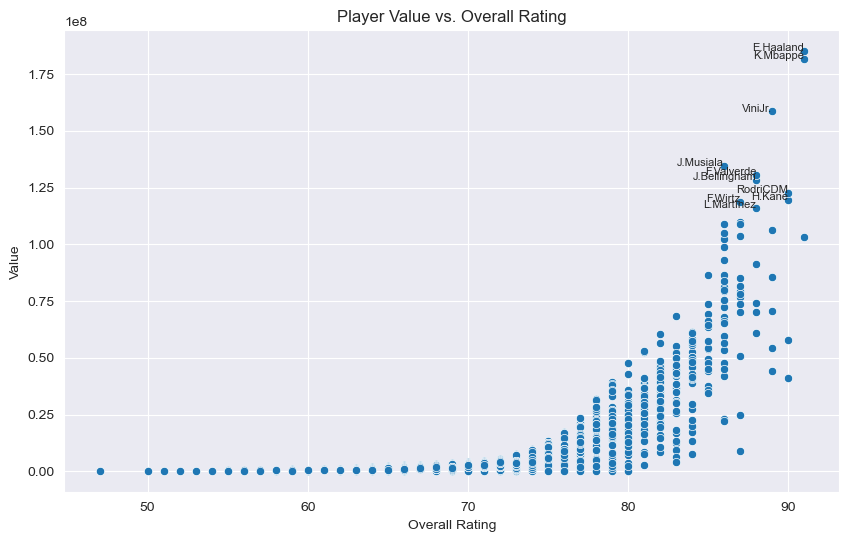

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=playerDF, x='Overall rating', y='Value')

# Annotate top 50 player names
top_50_players = playerDF.nlargest(10, 'Value')  # Get the top 50 players based on value
for i, row in top_50_players.iterrows():
    plt.text(row['Overall rating'], row['Value'], row['name'], fontsize=8, ha='right')

plt.title('Player Value vs. Overall Rating')
plt.xlabel('Overall Rating')
plt.ylabel('Value')
plt.show()

# Player attriabute difference between top 1,2,3 25 % , 50 % 75 %, 99% ranked players based on player value

C:\Users\ollee\AppData\Local\Temp\ipykernel_18288\3122871247.py:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('tab20')


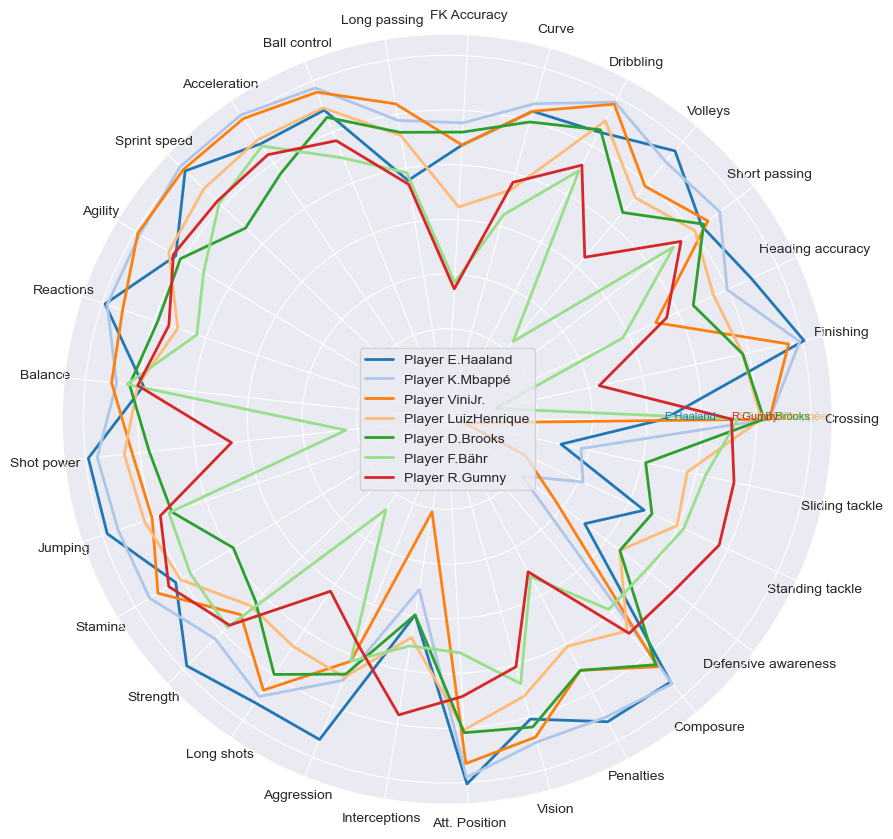

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap

# Select the top 50 players based on their value
top_50_players = log_df.nlargest(3, 'Value')

# Get the indices for players at 25%, 50%, and 75% of the top players
num_players = log_df.shape[0]
players_indices = top_50_players.index.tolist()

# Select the players based on the indices
players_to_compare = log_df.iloc[players_indices]

players_indices += [int(num_players * quantile) for quantile in [0.25, 0.5, 0.75, 0.99]]

# Define the variables for the radar chart
variables = ['Crossing', 'Finishing', 'Heading accuracy', 'Short passing', 'Volleys',
             'Dribbling', 'Curve', 'FK Accuracy', 'Long passing', 'Ball control',
             'Acceleration', 'Sprint speed', 'Agility', 'Reactions', 'Balance',
             'Shot power', 'Jumping', 'Stamina', 'Strength', 'Long shots',
             'Aggression', 'Interceptions', 'Att. Position', 'Vision', 'Penalties',
             'Composure', 'Defensive awareness', 'Standing tackle', 'Sliding tackle']

# Calculate the mean values for the selected players
mean_values = players_to_compare[variables].mean().values

# Normalize the mean values to the range [0, 1]
min_val = mean_values.min()
max_val = mean_values.max()
mean_values = (mean_values - min_val) / (max_val - min_val)

# Number of variables
num_vars = len(variables)

# Compute angle for each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop" and append the start value to the end.
mean_values = np.concatenate((mean_values, [mean_values[0]]))
angles += angles[:1]

# Define a colormap to map each player to a unique color
cmap = get_cmap('tab20')

# Plot
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))
for i, player_index in enumerate(players_indices):
    color = cmap(i)  # Get color from the colormap
    player_values = log_df.iloc[player_index][variables].values
    # Normalize player values to the same range as mean_values
    player_values = (player_values - min_val) / (max_val - min_val)
    player_values = np.concatenate((player_values, [player_values[0]]))  # Repeat the first value to close the loop
    player_name = log_df.iloc[player_index]['name']  # Get player name
    ax.plot(angles, player_values, color=color, linewidth=2, label=f'Player {player_name}')
    ax.text(angles[0], player_values[0], player_name, color=color, fontsize=8)

# Add labels
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(variables)

# Add legend
ax.legend(loc='center')

plt.show()


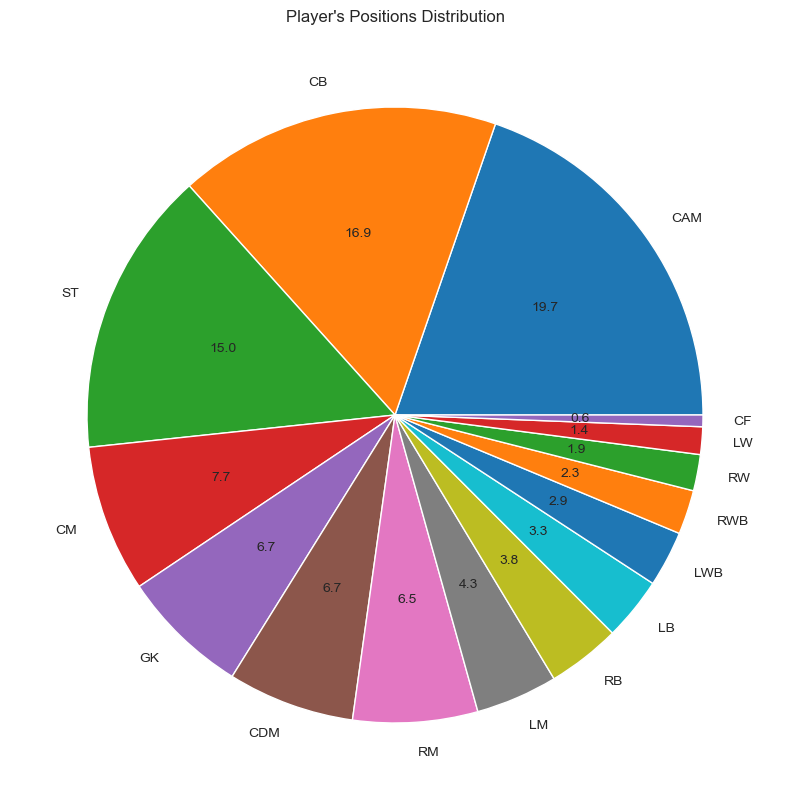

In [ ]:
plt.figure(figsize=(10,10))
loc=playerDF['Best position'].value_counts()
loc.plot(kind='pie' ,autopct='%.1f',fontsize=10,subplots=True)
plt.title("Player's Positions Distribution")
plt.ylabel("")
plt.show()

In [ ]:
playerDF

,name,Age,Overall rating,Potential,Team,ID,Height,Weight,foot,Best overall,...,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,Position
0,S.Szyma?ski,24,80.0,84.0,Fenerbahçe,235973,174.59,60.0,Left,82,...,14,2027,423,1,81,77,78,79,51,CAM
1,A.Diao,17,70.0,86.0,Real Betis,275324,185.61,72.0,Right,71,...,11,1711,372,1,84,69,60,73,30,LM
2,A.Obando,17,66.0,85.0,Barcelona Guayaquil,278856,188.62,79.0,Right,68,...,13,1582,338,1,69,61,48,65,29,ST
3,V.Gyökeres,25,79.0,84.0,Sporting CP,241651,187.62,90.0,Right,81,...,8,1970,425,1,82,77,66,77,35,ST
4,K.Mainoo,18,70.0,86.0,Manchester United,269136,184.60,80.0,Right,71,...,9,1892,408,1,74,58,66,73,68,CM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2623,C.Rodríguez,26,76.0,79.0,Mexico,235389,171.57,64.0,Right,78,...,10,1994,429,1,77,67,73,78,66,CM
2624,R.Majecki,23,72.0,79.0,Monaco,235413,193.64,78.0,Right,72,...,74,1126,382,1,73,69,65,74,31,GK
2625,19 J.Al,26,59.0,60.0,Al Batin,235596,183.60,80.0,Right,59,...,5,1573,336,1,51,45,55,58,58,CDM
2626,V.Nelsson,24,77.0,80.0,Galatasaray,235658,185.61,78.0,Right,79,...,14,1832,392,1,63,43,58,66,78,CB


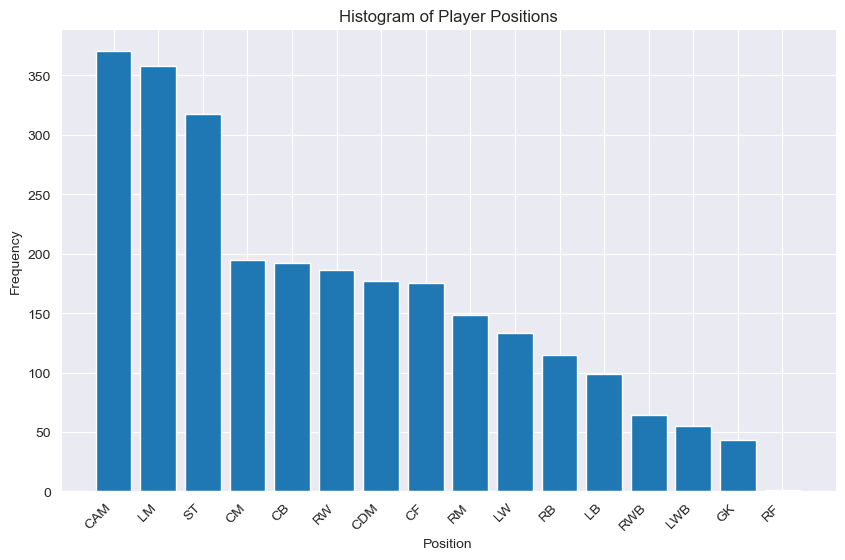

In [ ]:
import matplotlib.pyplot as plt

# Get unique positions
unique_positions = playerDF['Position'].unique()

# Count occurrences of each position
position_counts = playerDF['Position'].value_counts()

# Plot histogram
plt.figure(figsize=(10, 6))
plt.bar(unique_positions, position_counts)

# Set labels and title
plt.xlabel('Position')
plt.ylabel('Frequency')
plt.title('Histogram of Player Positions')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

plt.show()


<Figure size 2000x2000 with 0 Axes>

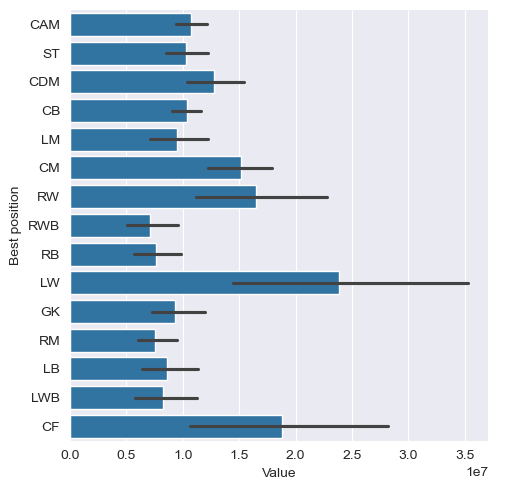

In [ ]:
plt.figure(figsize=(10,10),dpi=200)
graph = sns.catplot(y="Best position", x="Value", kind="bar",  data=playerDF)
plt.show()

Quartile Values:
25%     1800000.0
50%     4200000.0
75%    12500000.0
Name: Value, dtype: float64


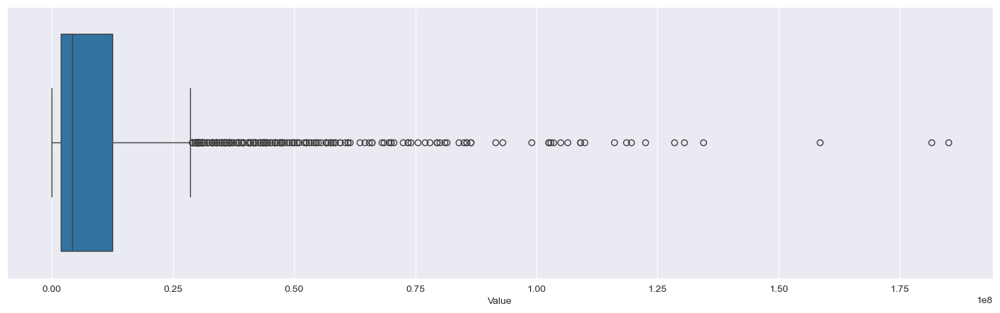

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=[18,5])
sns.boxplot(x=playerDF['Value'], data=playerDF)

# Get quartile values using describe()
quartiles = playerDF['Value'].describe(percentiles=[.25, .5, .75])
print("Quartile Values:")
print(quartiles[['25%', '50%', '75%']])

plt.show()


In [ ]:
playerDF = playerDF.drop(['ID'], axis = 1)

In [ ]:
playerDF

,name,Age,Overall rating,Potential,Team,Height,Weight,foot,Best overall,Best position,...,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,Position
0,S.Szyma?ski,24,80.0,84.0,Fenerbahçe,174.59,60.0,Left,82,CAM,...,14,2027,423,1,81,77,78,79,51,CAM
1,A.Diao,17,70.0,86.0,Real Betis,185.61,72.0,Right,71,CAM,...,11,1711,372,1,84,69,60,73,30,LM
2,A.Obando,17,66.0,85.0,Barcelona Guayaquil,188.62,79.0,Right,68,ST,...,13,1582,338,1,69,61,48,65,29,ST
3,V.Gyökeres,25,79.0,84.0,Sporting CP,187.62,90.0,Right,81,ST,...,8,1970,425,1,82,77,66,77,35,ST
4,K.Mainoo,18,70.0,86.0,Manchester United,184.60,80.0,Right,71,CDM,...,9,1892,408,1,74,58,66,73,68,CM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2623,C.Rodríguez,26,76.0,79.0,Mexico,171.57,64.0,Right,78,CAM,...,10,1994,429,1,77,67,73,78,66,CM
2624,R.Majecki,23,72.0,79.0,Monaco,193.64,78.0,Right,72,GK,...,74,1126,382,1,73,69,65,74,31,GK
2625,19 J.Al,26,59.0,60.0,Al Batin,183.60,80.0,Right,59,CDM,...,5,1573,336,1,51,45,55,58,58,CDM
2626,V.Nelsson,24,77.0,80.0,Galatasaray,185.61,78.0,Right,79,CB,...,14,1832,392,1,63,43,58,66,78,CB


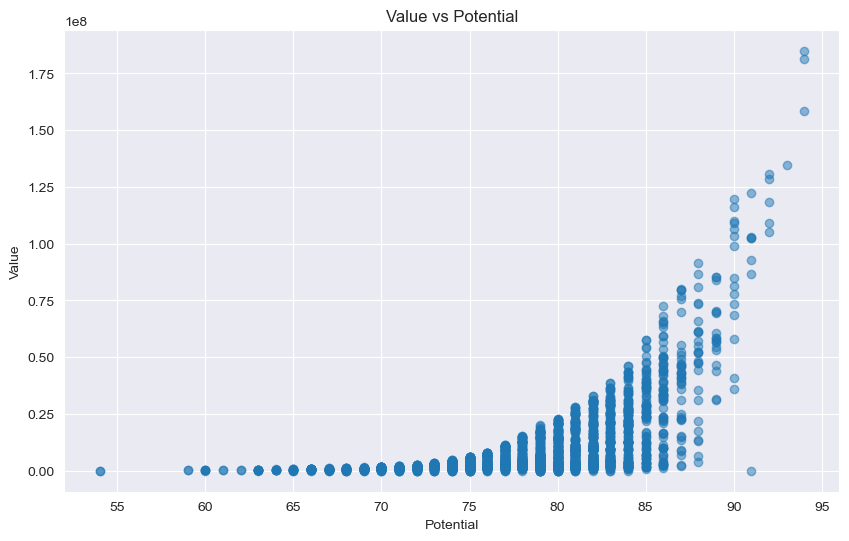

In [ ]:
import matplotlib.pyplot as plt

# Plot 'Value' based on 'Potential'
plt.figure(figsize=(10, 6))
plt.scatter(playerDF['Potential'], playerDF['Value'], alpha=0.5)
plt.title('Value vs Potential')
plt.xlabel('Potential')
plt.ylabel('Value')
plt.grid(True)
plt.show()


In [ ]:
playerDF.nlargest(50, 'Potential')


,name,Age,Overall rating,Potential,Team,Height,Weight,foot,Best overall,Best position,...,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,Position
23,K.Mbappé,24,91.0,94.0,Paris Saint Germain,182.60,75.0,Right,93,ST,...,6,2204,473,5,97,90,80,92,36,LW
50,E.Haaland,22,91.0,94.0,Manchester City,195.65,94.0,Left,93,ST,...,7,2158,461,5,89,93,66,80,45,ST
109,ViniJr.,22,89.0,94.0,Real Madrid,176.59,73.0,Right,89,LW,...,10,2028,443,5,95,82,78,90,29,ST
44,J.Musiala,20,86.0,93.0,FC Bayern München,184.60,72.0,Right,88,CAM,...,11,2090,451,3,85,75,76,91,63,LM
17,J.Bellingham,20,88.0,92.0,Real Madrid,186.61,75.0,Right,90,CAM,...,8,2282,490,4,80,82,81,87,78,CM
33,K.Kvaratskhelia,22,86.0,92.0,Napoli,183.60,70.0,Right,87,CAM,...,8,2074,445,2,86,79,81,87,41,RW
57,F.Wirtz,20,87.0,92.0,Bayer 04 Leverkusen,1775.10,71.0,Right,89,CAM,...,10,2085,442,3,80,76,86,87,50,CAM
136,PedriCM,20,86.0,92.0,FC Barcelona,174.59,60.0,Right,88,CM,...,8,2138,461,3,78,69,82,88,70,LW
164,F.Valverde,24,88.0,92.0,Real Madrid,182.60,78.0,Right,90,CM,...,8,2291,499,3,88,81,84,84,80,RW
69,K.De,32,91.0,91.0,Manchester City,1815.11,75.0,Right,91,CM,...,13,2325,486,5,74,88,94,87,65,CAM


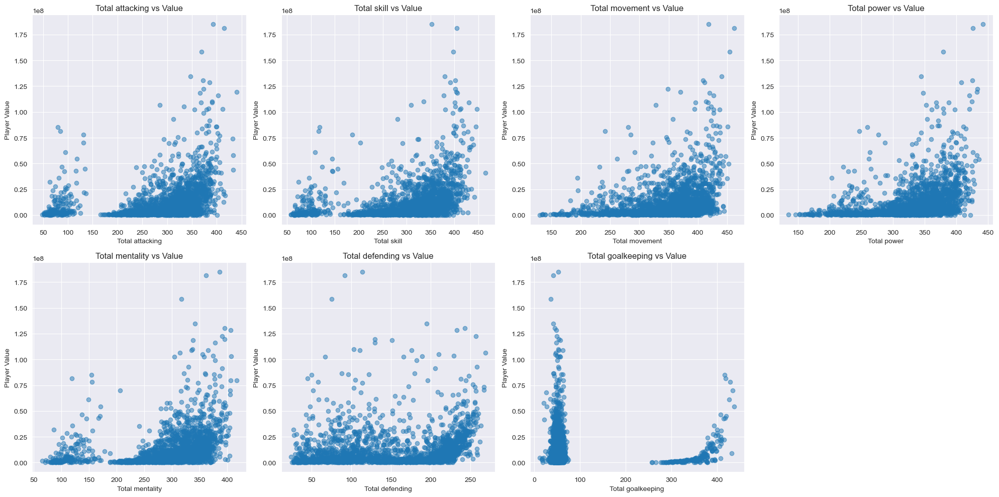

In [ ]:
import matplotlib.pyplot as plt

# Define attributes to compare
attributes = ['Total attacking', 'Total skill', 'Total movement', 'Total power',
              'Total mentality', 'Total defending', 'Total goalkeeping']

# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))

for i, ax in enumerate(axes.flat):
    if i < len(attributes):
        attribute = attributes[i]
        ax.scatter(playerDF[attribute], playerDF['Value'], alpha=0.5)
        ax.set_title(f'{attribute} vs Value')
        ax.set_xlabel(attribute)
        ax.set_ylabel('Player Value')
        ax.grid(True)

# Hide unused subplots
for ax in axes.flat[len(attributes):]:
    ax.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
playerDF.dtypes

name                     object
Age                       int64
Overall rating          float64
Potential               float64
Team                     object
                         ...   
Shooting / Handling       int64
Passing / Kicking         int64
Dribbling / Reflexes      int64
Defending / Pace          int64
Position                 object
Length: 64, dtype: object

In [ ]:

# Assuming 'playerDF' is your DataFrame
# Create dummy variables for each position
position_dummies = pd.get_dummies(playerDF['Position'], prefix='Position')

# Concatenate the dummy variables with the original DataFrame
playerDF_with_dummies = pd.concat([playerDF, position_dummies], axis=1)

# Drop the 'Position' column from the DataFrame with dummy variables
playerDF_with_dummies = playerDF_with_dummies.drop(columns=['Position'])

# Display the modified DataFrame
print(playerDF_with_dummies)



playerDF =playerDF_with_dummies


             name  Age  Overall rating  Potential                 Team  \
0     S.Szyma?ski   24            80.0       84.0           Fenerbahçe   
1          A.Diao   17            70.0       86.0           Real Betis   
2        A.Obando   17            66.0       85.0  Barcelona Guayaquil   
3      V.Gyökeres   25            79.0       84.0          Sporting CP   
4        K.Mainoo   18            70.0       86.0    Manchester United   
...           ...  ...             ...        ...                  ...   
2623  C.Rodríguez   26            76.0       79.0               Mexico   
2624    R.Majecki   23            72.0       79.0               Monaco   
2625      19 J.Al   26            59.0       60.0             Al Batin   
2626    V.Nelsson   24            77.0       80.0          Galatasaray   
2627      A.Mumin   25            70.0       77.0       Rayo Vallecano   

      Height  Weight   foot  Best overall Best position  ...  Position_LB  \
0     174.59    60.0   Left       

In [ ]:
tempDF = playerDF.drop(columns=['name', 'foot','Team' ,'Best position','Wage','Crossing','Short passing','Volleys','Dribbling','Curve','FK Accuracy','Long passing','Acceleration','Agility','Reactions','Balance','Jumping','Stamina','Long shots','Aggression','Interceptions','Penalties','Composure','Standing tackle','Sliding tackle','Total goalkeeping','Base stats', 'Best overall','Heading accuracy','Total stats'],axis = 1)


# Correlation Matrix

In [ ]:
#correlation_matrix = tempDF.corr()

In [ ]:
#correlation_matrix.shape

In [ ]:
#correlation_with_target = correlation_matrix['Value']

In [ ]:
#correlation_with_target.sort_values(ascending = False)

In [ ]:
tempDF = tempDF.drop(columns = ['Release clause','Overall rating','International reputation','Potential'],axis = 1)

In [ ]:
correlation_matrix = tempDF.corr()

In [ ]:
correlation_with_target = correlation_matrix['Value']

In [ ]:
correlation_with_target.sort_values(ascending = False)

Value                   1.000000
Dribbling / Reflexes    0.503313
Passing / Kicking       0.491185
Vision                  0.411860
Total power             0.382273
Shot power              0.357420
Shooting / Handling     0.339185
Total mentality         0.334326
Ball control            0.324665
Total skill             0.318726
Total attacking         0.316744
Total movement          0.290050
Att. Position           0.259116
Finishing               0.253504
Pace / Diving           0.237847
Strength                0.199263
Sprint speed            0.196460
Defending / Pace        0.174090
Age                     0.162266
Defensive awareness     0.159144
Total defending         0.133747
Weight                  0.056229
Position_ST             0.040196
Position_LW             0.034312
Position_CAM            0.022151
Position_LM             0.017907
Position_CF             0.011710
Position_RW             0.006892
GK Kicking              0.002718
Position_CB             0.002026
GK Reflexe

In [ ]:
tempDF = tempDF.drop(columns = ['Dribbling / Reflexes','Passing / Kicking','Total power'],axis = 1)

In [ ]:
x = tempDF.corr()

In [ ]:
x['Value']

Age                    0.162266
Height                -0.003511
Weight                 0.056229
Growth                -0.282980
Value                  1.000000
Total attacking        0.316744
Finishing              0.253504
Total skill            0.318726
Ball control           0.324665
Total movement         0.290050
Sprint speed           0.196460
Shot power             0.357420
Strength               0.199263
Total mentality        0.334326
Att. Position          0.259116
Vision                 0.411860
Total defending        0.133747
Defensive awareness    0.159144
GK Diving             -0.004689
GK Handling           -0.001228
GK Kicking             0.002718
GK Positioning        -0.004487
GK Reflexes            0.001261
Pace / Diving          0.237847
Shooting / Handling    0.339185
Defending / Pace       0.174090
Position_CAM           0.022151
Position_CB            0.002026
Position_CDM          -0.014179
Position_CF            0.011710
Position_CM           -0.000621
Position

Text(0.5, 1.0, 'Correlation Heatmap')

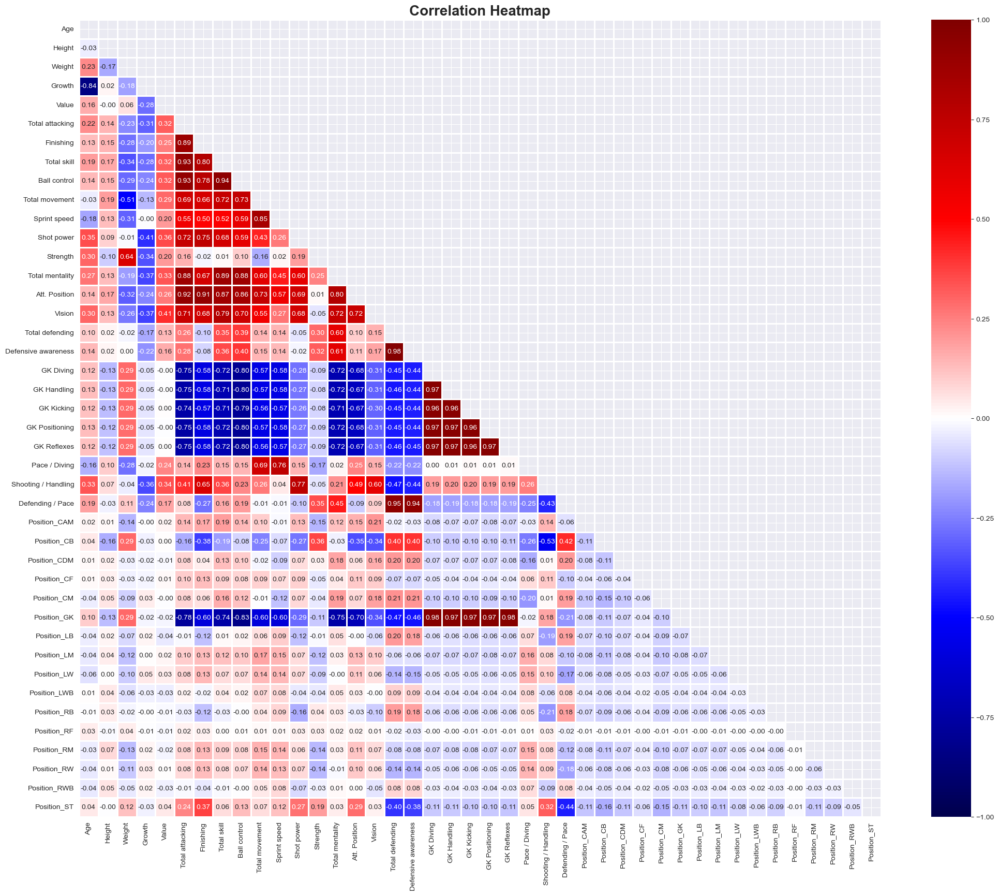

In [ ]:
import seaborn as sns
fig = plt.figure(figsize=[25,20])
mask = np.triu(np.ones_like(x, dtype=bool))
sns.heatmap(x,cmap='seismic',linewidth=1,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)

In [ ]:
playerDF.dtypes

name               object
Age                 int64
Overall rating    float64
Potential         float64
Team               object
                   ...   
Position_RF          bool
Position_RM          bool
Position_RW          bool
Position_RWB         bool
Position_ST          bool
Length: 79, dtype: object

In [ ]:
new_df = playerDF[['name','Age','Vision','Dribbling / Reflexes','Passing / Kicking','Shooting / Handling','International reputation','Total mentality','Shot power','Total power','Ball control','Finishing','Value']]
p_data = playerDF[['Vision','Growth','Dribbling / Reflexes','Passing / Kicking','Shooting / Handling','International reputation','Total mentality','Shot power','Total power','Ball control','Finishing']]

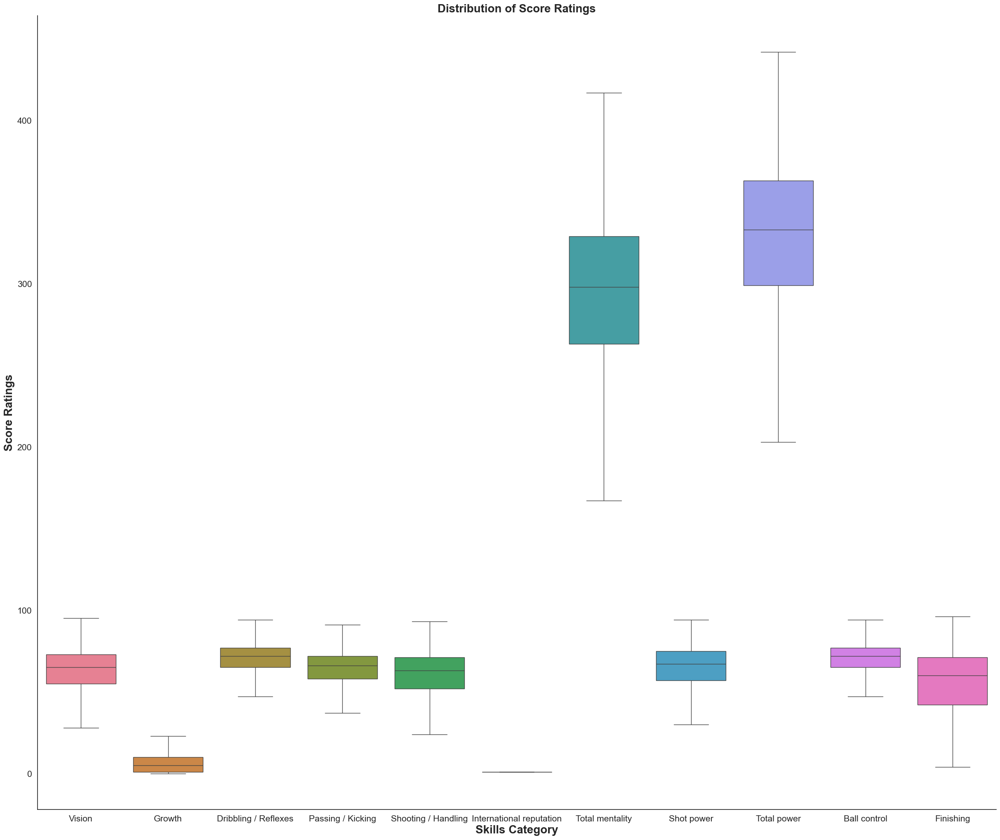

In [ ]:
fig = plt.figure(figsize=[30,25])
sns.set(style='white', font_scale=1.4)
sns.boxplot(data=p_data, showfliers=False)
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings', fontsize=20, weight='bold')
sns.despine()

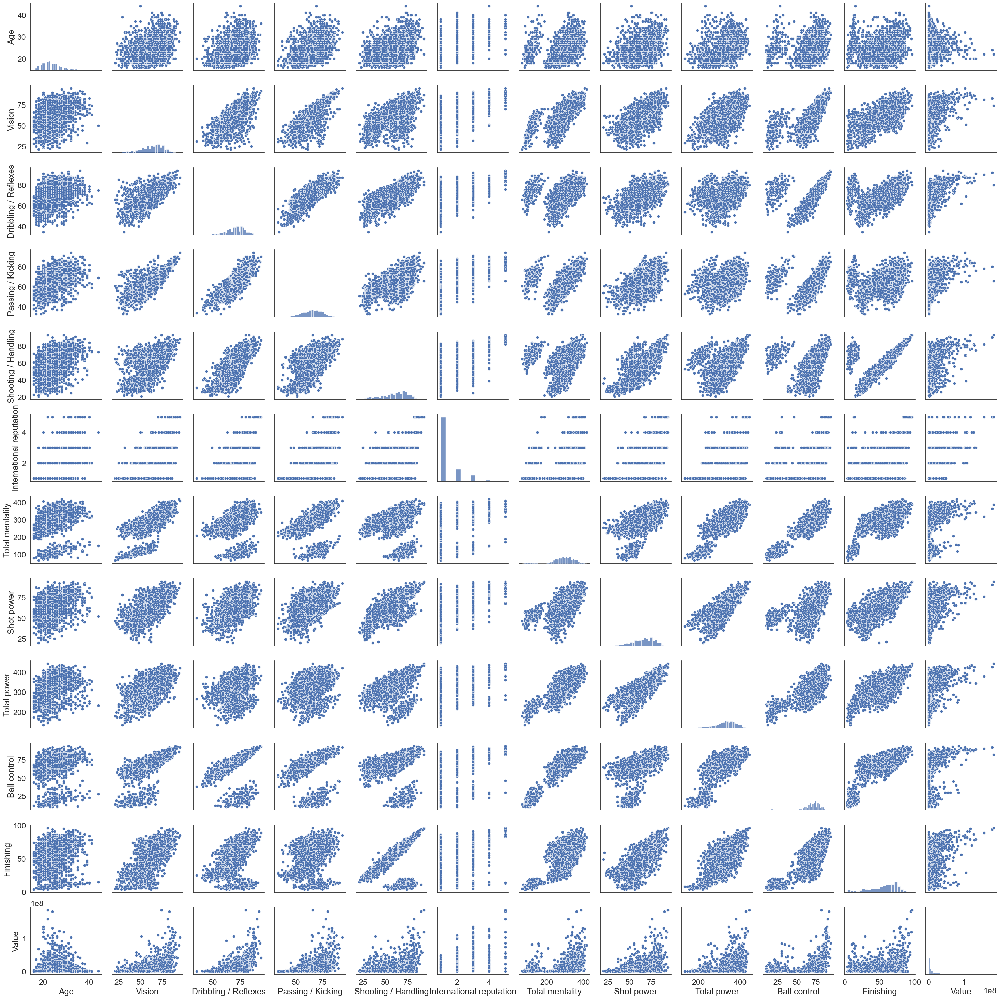

In [ ]:
sns.set(style='white',font_scale=1.5)
sns.pairplot(new_df)

In [ ]:
#new_corr = new_df.corr()

ValueError: could not convert string to float: 'S.Szyma?ski'

In [ ]:
import statsmodels.api as sm
import patsy
from patsy import dmatrices
y, X = patsy.dmatrices("Q('Value') ~ Q('Vision') + Q('Age') + Q('Dribbling / Reflexes') + Q('Passing / Kicking') + Q('Shooting / Handling') + Q('International reputation') + Q('Total mentality') + Q('Shot power') + Q('Total power') + Q('Ball control') + Q('Finishing')", data=new_df, return_type="dataframe")
model = sm.OLS(y, X)
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Q('Value')   R-squared:                       0.563
Model:                            OLS   Adj. R-squared:                  0.561
Method:                 Least Squares   F-statistic:                     306.1
Date:                Wed, 20 Mar 2024   Prob (F-statistic):               0.00
Time:                        16:36:28   Log-Likelihood:                -46352.
No. Observations:                2628   AIC:                         9.273e+04
Df Residuals:                    2616   BIC:                         9.280e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                     -5.174e+07   2.55e+06    -20.294      0.000   -5.67e+07   -4.67e+07
Q('Vision')                   -1.691e+05   4.54e+04     -3.724      0.000   -2.58e+05   -8.01e+04
Q('Age')                      -1.402e+06   6.52e+04    -21.517      0.000   -1.53e+06   -1.27e+06
Q('Dribbling / Reflexes')      5.551e+05   7.05e+04      7.871      0.000    4.17e+05    6.93e+05
Q('Passing / Kicking')          2.74e+05   6.79e+04      4.035      0.000    1.41e+05    4.07e+05
Q('Shooting / Handling')       1.328e+05   8.13e+04      1.633      0.103   -2.67e+04    2.92e+05
Q('International reputation')  1.326e+07   3.76e+05     35.275      0.000    1.25e+07     1.4e+07
Q('Total mentality')           6887.2110   1.12e+04      0.614      0.539   -1.51e+04    2.89e+04
Q('Shot power')               -2.983e+05   4.83e+04     -6.180      0.000   -3.93e+05   -2.04e+05
Q('Total power')               1.436e+05   1.02e+04     14.025      0.000    1.24e+05    1.64e+05
Q('Ball control')              4.967e+04   6.42e+04      0.774      0.439   -7.62e+04    1.76e+05
Q('Finishing')                -1.739e+05   5.01e+04     -3.475      0.001   -2.72e+05   -7.58e+04
==============================================================================
Omnibus:                     1639.457   Durbin-Watson:                   1.654
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            34481.965
Skew:                           2.578   Prob(JB):                         0.00
Kurtosis:                      19.980   Cond. No.                     5.62e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.62e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

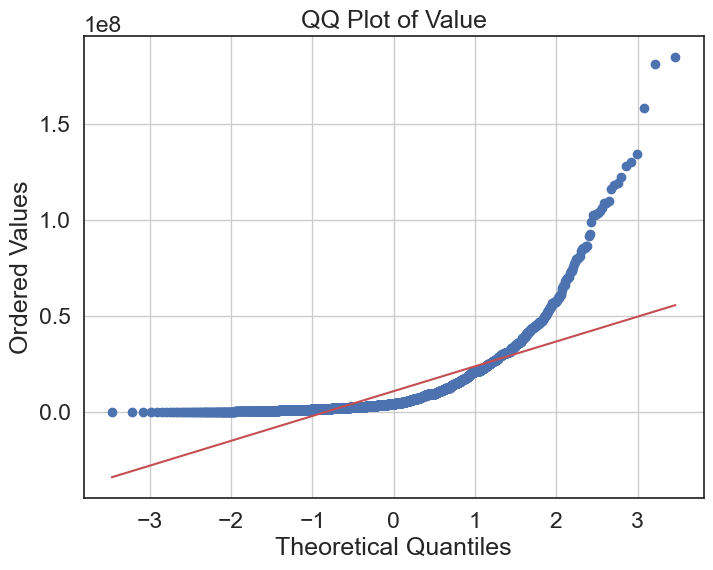

In [ ]:
import scipy.stats as stats
import matplotlib.pyplot as plt

# Generate QQ plot
plt.figure(figsize=(8, 6))
stats.probplot(new_df['Value'], dist="norm", plot=plt)
plt.title('QQ Plot of Value')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Ordered Values')
plt.grid(True)
plt.show()


In [ ]:
new_df['Value']


0       3.000000e+07
1       4.000000e+06
2       2.100000e+06
3       2.600000e+07
4       3.800000e+06
            ...     
2623    1.000000e-08
2624    4.000000e+06
2625    1.800000e+05
2626    1.300000e+07
2627    2.900000e+06
Name: Value, Length: 2628, dtype: float64

In [ ]:
import numpy as np

# Make a copy of the DataFrame
log_df = new_df.copy()

# Apply log transformation only to positive values of 'Value'
mask = log_df['Value'] > 0
log_df.loc[mask, 'Value'] = np.log(log_df.loc[mask,'Value'])
mask = (log_df['Value'] >= -20) & (log_df['Value'] <= -9)

# Remove rows where the 'Value' falls within the specified range
log_df = log_df[~mask]


In [ ]:
log_df['Value']

0       17.216708
1       15.201805
2       14.557448
3       17.073607
4       15.150512
          ...    
2622    14.808762
2624    15.201805
2625    12.100712
2626    16.380460
2627    14.880221
Name: Value, Length: 2564, dtype: float64

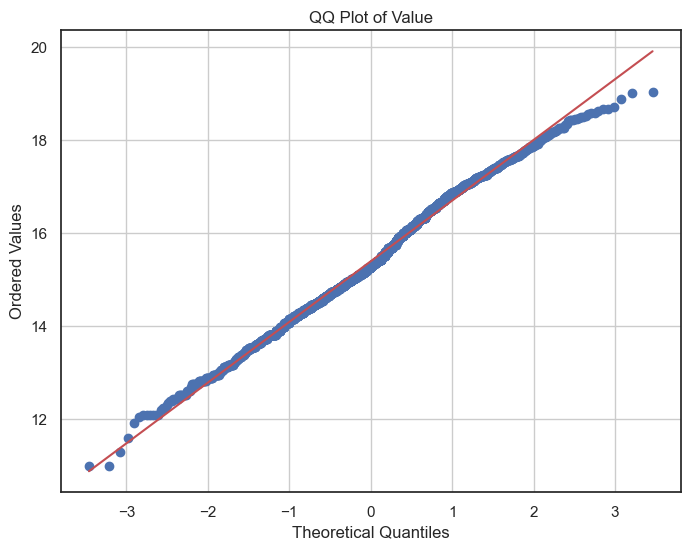

In [ ]:
import scipy.stats as stats
import matplotlib.pyplot as plt

# Generate QQ plot
plt.figure(figsize=(8, 6))
stats.probplot(log_df['Value'], dist="norm", plot=plt)
plt.title('QQ Plot of Value')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Ordered Values')
plt.grid(True)
plt.show()


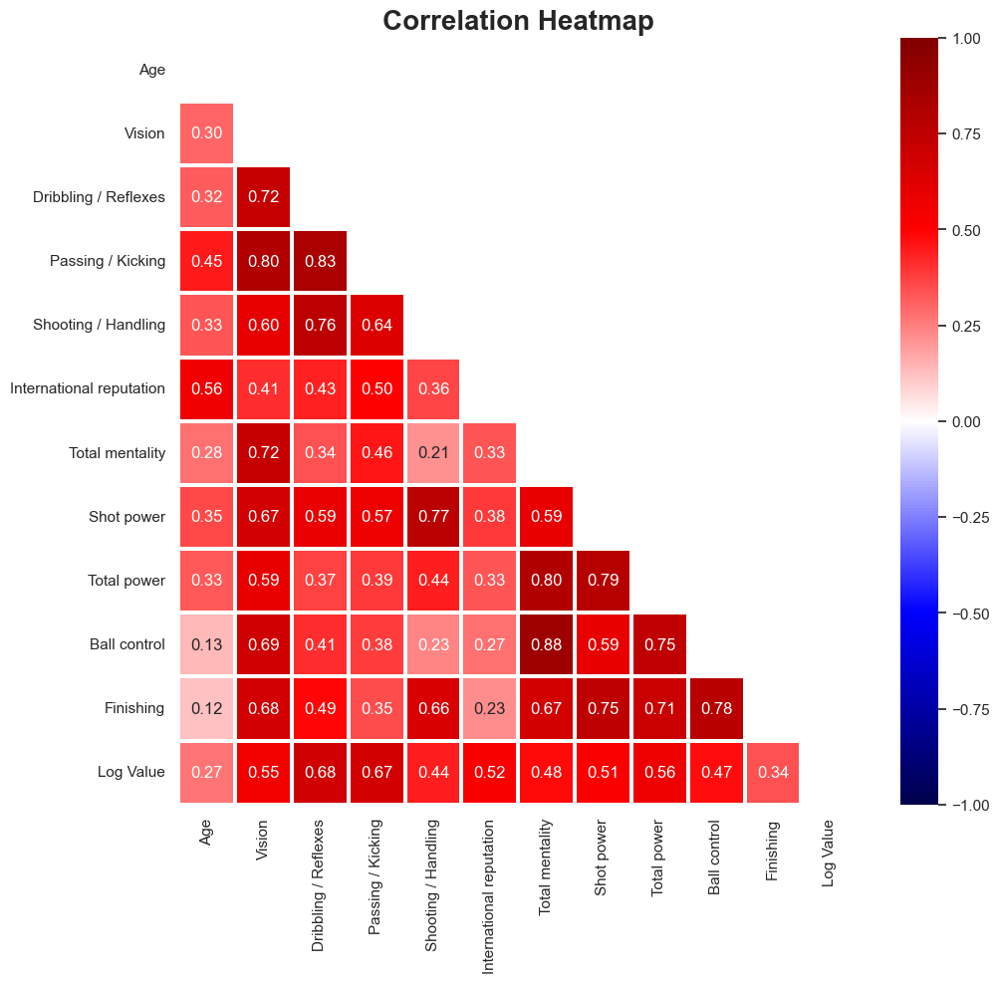

In [ ]:
log_df = log_df.rename(columns={'Value': 'Log Value'})
sns.set(font_scale=1,style='white')
corr_matrix = log_df.iloc[:,1:].corr()
fig = plt.figure(figsize=[11,10])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1.5,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)
plt.savefig('heatmap3.png',transparent=True, bbox_inches='tight')

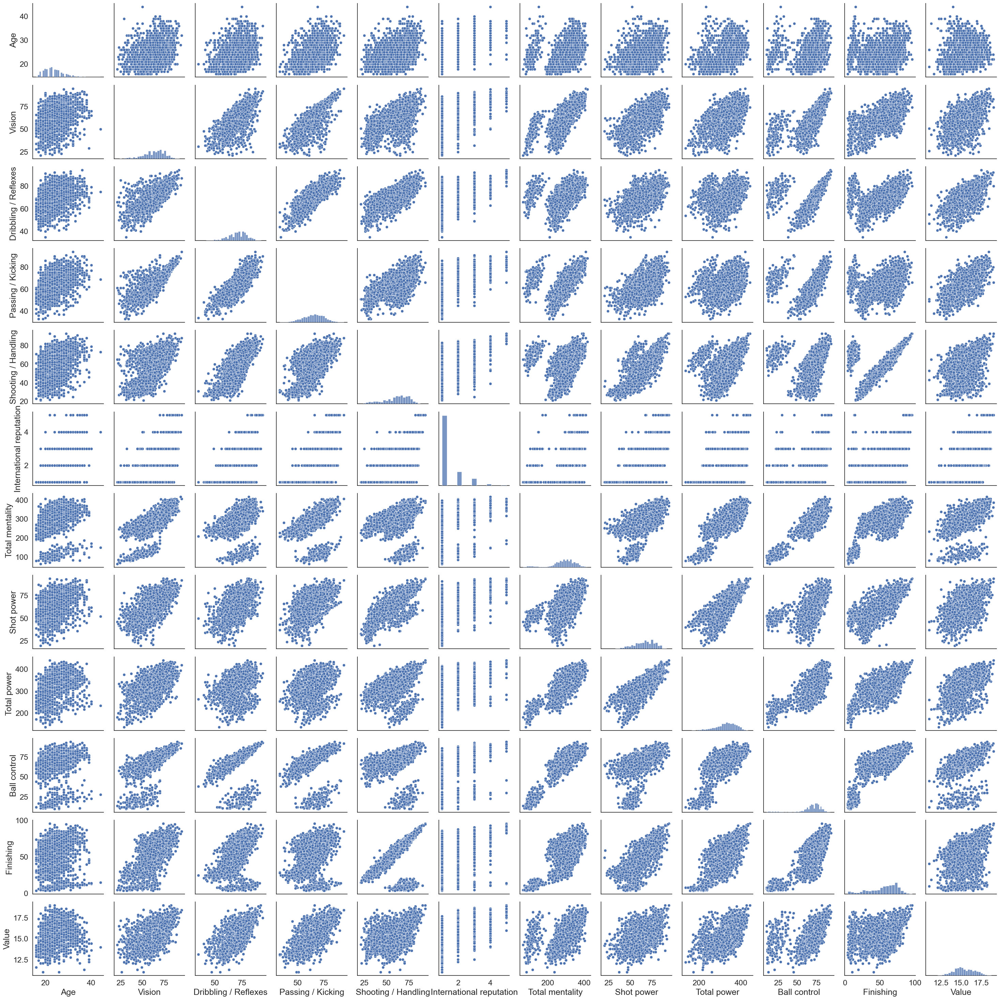

In [ ]:
sns.set(style='white', font_scale=1.5)
sns.pairplot(log_df)
plt.savefig('pairplot2.png', transparent=True, bbox_inches='tight')


In [ ]:
y, X = patsy.dmatrices("Q('Log Value') ~ Q('Age') + Q('Dribbling / Reflexes') + Q('Passing / Kicking') + Q('Shooting / Handling') + Q('International reputation') + Q('Total mentality') + Q('Shot power') + Q('Total power') + Q('Ball control') + Q('Finishing')", data=log_df, return_type="dataframe")

model = sm.OLS(y, X)
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         Q('Log Value')   R-squared:                       0.728
Model:                            OLS   Adj. R-squared:                  0.727
Method:                 Least Squares   F-statistic:                     683.4
Date:                Wed, 20 Mar 2024   Prob (F-statistic):               0.00
Time:                        17:22:20   Log-Likelihood:                -2656.4
No. Observations:                2564   AIC:                             5335.
Df Residuals:                    2553   BIC:                             5399.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                         5.9601      0.157     37.880      0.000       5.652       6.269
Q('Age')                         -0.0696      0.004    -16.851      0.000      -0.078      -0.061
Q('Dribbling / Reflexes')         0.0659      0.004     14.926      0.000       0.057       0.075
Q('Passing / Kicking')            0.0216      0.004      5.857      0.000       0.014       0.029
Q('Shooting / Handling')          0.0181      0.005      3.539      0.000       0.008       0.028
Q('International reputation')     0.4369      0.024     18.540      0.000       0.391       0.483
Q('Total mentality')             -0.0020      0.001     -3.023      0.003      -0.003      -0.001
Q('Shot power')                  -0.0241      0.003     -8.002      0.000      -0.030      -0.018
Q('Total power')                  0.0174      0.001     27.730      0.000       0.016       0.019
Q('Ball control')                 0.0271      0.004      6.733      0.000       0.019       0.035
Q('Finishing')                   -0.0373      0.003    -11.972      0.000      -0.043      -0.031
==============================================================================
Omnibus:                       51.731   Durbin-Watson:                   1.728
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               60.841
Skew:                           0.288   Prob(JB):                     6.14e-14
Kurtosis:                       3.487   Cond. No.                     5.50e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.5e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
def diagnostic_plot(x, y):
    plt.figure(figsize=(20,5))

    rgr = LinearRegression()
    rgr.fit(x,y)
    pred = rgr.predict(x)

    plt.subplot(1, 3, 1)
    plt.scatter(pred,y,alpha=0.1)
    plt.plot(y, y, color='red',linewidth=1,)
    plt.title("Regression fit")
    plt.xlabel("Predicted y")
    plt.ylabel("y")

    plt.subplot(1, 3, 2)
    res = y - pred
    plt.scatter(pred, res,alpha=0.1)
    plt.title("Residual plot")
    plt.xlabel("prediction")
    plt.ylabel("residuals")

    print(res)

    plt.subplot(1, 3, 3)
    #Generates a probability plot of sample data against the quantiles of a
    # specified theoretical distribution
    stats.probplot(res, dist="norm", plot=plt,)
    plt.title("Normal Q-Q plot")

In [ ]:
y = log_df['Log Value']
X = log_df.drop(['name', 'Log Value'],axis = 1)


0       1.475635
1      -0.074127
2       0.213225
3       0.855451
4      -0.443664
          ...   
2622   -0.108942
2624    0.479746
2625   -1.952699
2626    0.857174
2627   -0.008357
Name: Log Value, Length: 2564, dtype: float64


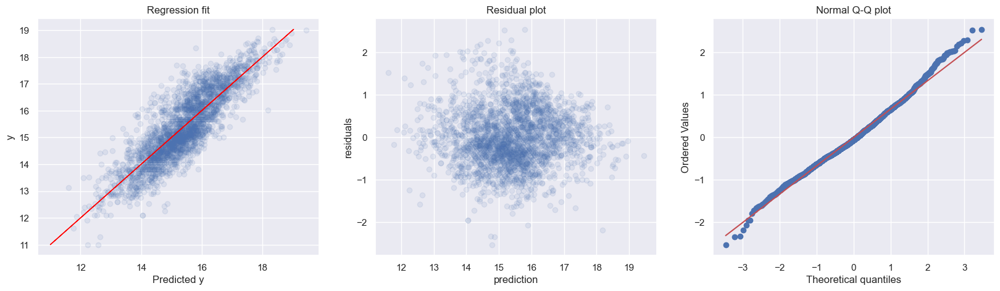

In [ ]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer

# Remove rows with missing values from X and y
combined_df = pd.concat([X, y], axis=1)
combined_df.dropna(inplace=True)

# Separate X and y after removing missing values
X = combined_df.iloc[:, :-1]
y = combined_df.iloc[:, -1]

# Use the diagnostic_plot() function with the updated X and y
sns.set(style='darkgrid')
diagnostic_plot(X, y)


In [ ]:
X_train_val, X_test, y_train_val, y_test = train_test_split(X,y,test_size=0.2,random_state = 42)

In [ ]:
log_df.columns

Index(['name', 'Age', 'Vision', 'Dribbling / Reflexes', 'Passing / Kicking',
       'Shooting / Handling', 'International reputation', 'Total mentality',
       'Shot power', 'Total power', 'Ball control', 'Finishing', 'Log Value'],
      dtype='object')

In [ ]:
log_df

,name,Age,Vision,Dribbling / Reflexes,Passing / Kicking,Shooting / Handling,International reputation,Total mentality,Shot power,Total power,Ball control,Finishing,Log Value
0,S.Szyma?ski,24,80.0,79,78,77,1,321,79.0,347,79.0,78.0,17.216708
1,A.Diao,17,62.0,73,60,69,1,262,65.0,315,74.0,73.0,15.201805
2,A.Obando,17,66.0,65,48,61,1,260,54.0,333,62.0,68.0,14.557448
3,V.Gyökeres,25,72.0,77,66,77,1,331,78.0,417,77.0,82.0,17.073607
4,K.Mainoo,18,67.0,73,66,58,1,313,64.0,327,68.0,59.0,15.150512
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2622,R.Ache,24,54.0,68,51,66,1,268,73.0,373,67.0,68.0,14.808762
2624,R.Majecki,23,41.0,74,65,69,1,129,49.0,206,28.0,19.0,15.201805
2625,19 J.Al,26,58.0,58,55,45,1,290,62.0,319,60.0,34.0,12.100712
2626,V.Nelsson,24,59.0,66,58,43,1,319,60.0,353,67.0,36.0,16.380460


In [ ]:
log_df.isna().sum()

name                        0
Age                         0
Vision                      0
Dribbling / Reflexes        0
Passing / Kicking           0
Shooting / Handling         0
International reputation    0
Total mentality             0
Shot power                  0
Total power                 0
Ball control                0
Finishing                   0
Log Value                   0
dtype: int64

In [ ]:
X_train = log_df.drop(['name', 'Log Value'], axis=1)
y_train = log_df['Log Value']
reg = LinearRegression()
model_l1 = reg.fit(X_train,y_train)

In [ ]:
model_l2 = reg.fit(X,y)

In [ ]:
model_l2.intercept_

5.765656881477117

In [ ]:
model_l1.intercept_


5.765656881477117

In [ ]:
model_l1.coef_

array([-7.36073888e-02, -2.69697461e-02,  6.58006587e-02,  4.14686903e-02,
        2.03183142e-02,  4.29368367e-01, -6.73936167e-05, -2.39574768e-02,
        1.61973531e-02,  2.99067832e-02, -3.32815275e-02])

In [ ]:
reg.score(X_train,y_train)

0.7375720654745377

In [ ]:
yd, xd = patsy.dmatrices("Q('Log Value') ~ Q('Age') + Q('Dribbling / Reflexes') + Q('Passing / Kicking') + Q('Shooting / Handling') + Q('International reputation') + Q('Total mentality') + Q('Shot power') + Q('Total power') + Q('Ball control') + Q('Finishing')", data=log_df, return_type="dataframe")

model = sm.OLS(yd, xd)
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         Q('Log Value')   R-squared:                       0.728
Model:                            OLS   Adj. R-squared:                  0.727
Method:                 Least Squares   F-statistic:                     683.4
Date:                Wed, 20 Mar 2024   Prob (F-statistic):               0.00
Time:                        17:40:56   Log-Likelihood:                -2656.4
No. Observations:                2564   AIC:                             5335.
Df Residuals:                    2553   BIC:                             5399.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                         5.9601      0.157     37.880      0.000       5.652       6.269
Q('Age')                         -0.0696      0.004    -16.851      0.000      -0.078      -0.061
Q('Dribbling / Reflexes')         0.0659      0.004     14.926      0.000       0.057       0.075
Q('Passing / Kicking')            0.0216      0.004      5.857      0.000       0.014       0.029
Q('Shooting / Handling')          0.0181      0.005      3.539      0.000       0.008       0.028
Q('International reputation')     0.4369      0.024     18.540      0.000       0.391       0.483
Q('Total mentality')             -0.0020      0.001     -3.023      0.003      -0.003      -0.001
Q('Shot power')                  -0.0241      0.003     -8.002      0.000      -0.030      -0.018
Q('Total power')                  0.0174      0.001     27.730      0.000       0.016       0.019
Q('Ball control')                 0.0271      0.004      6.733      0.000       0.019       0.035
Q('Finishing')                   -0.0373      0.003    -11.972      0.000      -0.043      -0.031
==============================================================================
Omnibus:                       51.731   Durbin-Watson:                   1.728
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               60.841
Skew:                           0.288   Prob(JB):                     6.14e-14
Kurtosis:                       3.487   Cond. No.                     5.50e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.5e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# Random forest model

In [ ]:
from sklearn.ensemble import RandomForestRegressor

forest = RandomForestRegressor()

forest.fit(X_train, y_train)

RandomForestRegressor()

In [ ]:
forest.score(X_train, y_train)

0.9783249654756082

In [ ]:
forest.predict(X_test)

array([16.51272623, 13.95260425, 13.75182249, 16.56125182, 16.90778919,
       16.48263744, 15.11737435, 17.99372521, 15.37236874, 14.3278128 ,
       15.01302095, 15.52102742, 16.6867887 , 15.0144632 , 15.7588835 ,
       16.53472521, 16.87375431, 13.8933613 , 14.01289753, 16.39650387,
       17.54813087, 16.25567323, 13.68404107, 16.59192862, 15.74996568,
       15.55674576, 13.48241962, 17.13642606, 14.18158964, 13.02873143,
       13.02226173, 14.32321105, 15.78079428, 14.04656711, 15.48407531,
       15.87791708, 16.63900115, 14.78998594, 15.77288816, 16.9018899 ,
       15.31774366, 14.91708089, 17.22355149, 14.72063155, 18.48309842,
       13.8349578 , 13.85583933, 14.923151  , 15.9544644 , 16.72439347,
       17.26392579, 13.89543492, 15.05343474, 14.74944604, 17.66207267,
       16.31526069, 15.15389854, 13.09563569, 14.72311946, 16.41765271,
       15.21923849, 14.36991191, 14.53361782, 16.85984821, 15.3555947 ,
       15.99248893, 13.74461991, 14.0017173 , 17.79957381, 17.57

In [ ]:
np.array([y_test
          ])

array([[16.48965921, 14.28551419, 13.76421726, 16.81124283, 17.4661688 ,
        16.52356076, 15.0964444 , 18.20995971, 15.42494847, 14.28551419,
        14.91412285, 15.38412648, 16.73328129, 14.91412285, 15.42494847,
        16.45456789, 16.83593544, 13.81551056, 14.07787482, 16.21340583,
        17.90148687, 16.3412392 , 13.56061831, 16.3412392 , 15.60727003,
        15.42494847, 13.56061831, 16.97251098, 14.15198279, 12.95984445,
        12.52452638, 14.5574479 , 15.76142071, 13.91082074, 15.52025865,
        16.25785759, 16.78592502, 14.73180129, 16.01273514, 17.31201812,
        15.25059508, 14.94691267, 17.21670794, 14.80876233, 18.59042352,
        13.81551056, 13.71015004, 14.84512998, 15.83041358, 17.0736071 ,
        17.0736071 , 13.65299163, 14.94691267, 14.64841968, 17.64415195,
        16.30041721, 15.20180492, 13.01700286, 14.60396792, 16.70588232,
        15.27412558, 14.28551419, 14.60396792, 17.24949776, 15.38412648,
        16.55635058, 13.71015004, 14.07787482, 17.9

In [ ]:
X_test.head()

,Age,Vision,Dribbling / Reflexes,Passing / Kicking,Shooting / Handling,International reputation,Total mentality,Shot power,Total power,Ball control,Finishing
1340,24,78.0,77,75,69,2,343,74.0,366,79.0,65.0
2042,18,50.0,65,65,65,1,105,49.0,228,25.0,6.0
1563,20,59.0,65,60,56,1,256,58.0,254,65.0,57.0
494,21,73.0,73,73,60,1,343,70.0,360,76.0,54.0
1838,27,62.0,71,68,32,2,291,37.0,288,79.0,36.0


In [ ]:
reg.predict(X_test)

array([16.66454079, 14.87478728, 13.78888739, 16.33686071, 16.03007401,
       15.8794021 , 15.37957945, 17.98466151, 15.56799658, 14.31770432,
       15.65868627, 14.78112911, 16.37462268, 15.21982756, 15.68989402,
       15.85338121, 16.15065805, 14.05007121, 14.13483264, 15.96143169,
       17.53919468, 15.51942664, 14.8543314 , 16.79381617, 16.55745813,
       15.80509951, 13.62304587, 16.81100633, 14.34541648, 13.77325475,
       14.8643602 , 13.55985414, 16.16664383, 14.69550051, 15.32254681,
       15.95565723, 15.85330569, 15.49769473, 15.65328037, 16.51639045,
       16.02694832, 15.30480017, 16.48699927, 14.91770438, 17.82284837,
       13.68860653, 14.72931166, 15.45284132, 14.91960542, 16.11878329,
       16.81455662, 14.69468314, 15.18918379, 15.07231181, 17.46232309,
       15.19544523, 15.70203366, 13.90364172, 14.11977803, 15.63964707,
       15.71762582, 15.0415194 , 14.12086158, 17.31313726, 15.01507001,
       15.09283452, 13.49538304, 14.55948501, 18.22546943, 17.54

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error

# Assuming you have your feature matrix X and target vector y ready

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize models
models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(),
    'Lasso Regression': Lasso(),
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'SVR': SVR(),
    'MLP Neural Network': MLPRegressor()
}

result = []
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score = model.score(X_train, y_train)
    mse = mean_squared_error(y_test, y_pred)
    result.append((name, mse, y_pred, score))  # Append a tuple containing name, MSE, and predictions

# Sort the result list based on MSE (index 1 of each tuple)
result_sorted = sorted(result, key=lambda x: x[3])

# Print the sorted results
for name, mse, y_pred, score in result_sorted:
    print(f'Model: {name}: Has accuracy score : {score} Mean Squared Error = {mse}, Market Value = {np.exp(y_pred[0])} $')



Model: Lasso Regression: Has accuracy score : 0.6310139181784226 Mean Squared Error = 0.6385470065068174, Market Value = 12374293.403304853 $
Model: SVR: Has accuracy score : 0.6628044262690123 Mean Squared Error = 0.5714133731690955, Market Value = 13695151.199921649 $
Model: MLP Neural Network: Has accuracy score : 0.6833984202993555 Mean Squared Error = 0.5106447544744309, Market Value = 18417355.96924896 $
Model: Ridge Regression: Has accuracy score : 0.7280992985723536 Mean Squared Error = 0.42861172291818844, Market Value = 16983824.439426564 $
Model: Linear Regression: Has accuracy score : 0.7280993797794296 Mean Squared Error = 0.42861230990690646, Market Value = 16987387.86008882 $
Model: Gradient Boosting: Has accuracy score : 0.8948190052832288 Mean Squared Error = 0.2435856573369112, Market Value = 17474719.952160183 $
Model: Random Forest: Has accuracy score : 0.9770707349695361 Mean Squared Error = 0.23609340376420088, Market Value = 15898456.610188315 $
Model: Decision T

In [ ]:
# Assuming you have trained your model and obtained predictions on the testing dataset
predictions_forest = forest.predict(X_test)
predictions_reg = reg.predict(X_test)
# Create a new DataFrame for predictions and actual values
results_df = pd.DataFrame({'Predicted Market Value (Random Forest)': predictions_forest,
                           'Predicted Market Value (Linear Regression)': predictions_reg,
                           'Actual Market Value': y_test})



In [ ]:
results_df

,Predicted Market Value (Random Forest),Predicted Market Value (Linear Regression),Actual Market Value
1340,16.512726,16.664541,16.489659
2042,13.952604,14.874787,14.285514
1563,13.751822,13.788887,13.764217
494,16.561252,16.336861,16.811243
1838,16.907789,16.030074,17.466169
...,...,...,...
1943,13.413198,14.270723,13.422468
964,14.198725,14.552475,14.220976
2534,15.303465,15.746322,15.176487
2054,13.685099,14.031755,13.737549


In [ ]:
from sklearn import metrics

In [ ]:
mean_sq_err_forest = metrics.mean_squared_error(y_test, predictions_forest)

In [ ]:
RMSE_forest = np.sqrt(mean_sq_err_forest)

In [ ]:
mean_sq_err_reg = metrics.mean_squared_error(y_test, predictions_reg)

In [ ]:
RMSE_reg = np.sqrt(mean_sq_err_reg)
RMSE_reg

0.6486665660885556

In [ ]:
RMSE_forest

0.185098778721354

# TESTING MODEL

In [ ]:
X_train = log_df.drop(['name', 'Log Value'], axis=1)
y_train = log_df['Log Value']
forest.fit(X_train, y_train)


RandomForestRegressor()

In [ ]:
forest.score(X_train, y_train)

0.978270515425589

In [ ]:
forest.predict(X_train)

array([16.9922691 , 15.2433631 , 14.3438269 , ..., 13.05742018,
       16.19051579, 14.98875571])

In [ ]:

predictions_forest_train = forest.predict(X_train)

results_df_train = pd.DataFrame({'Predicted Market Value (Random Forest)': predictions_forest_train,

                                 'Actual Market Value': y_train})

In [ ]:
results_df_train

,Predicted Market Value (Random Forest),Actual Market Value
0,16.992269,17.216708
1,15.243363,15.201805
2,14.343827,14.557448
3,17.031426,17.073607
4,15.132738,15.150512
...,...,...
2622,14.757165,14.808762
2624,15.057931,15.201805
2625,13.057420,12.100712
2626,16.190516,16.380460


In [ ]:
results_df_train

,Predicted Market Value (Random Forest),Actual Market Value
0,16.992269,17.216708
1,15.243363,15.201805
2,14.343827,14.557448
3,17.031426,17.073607
4,15.132738,15.150512
...,...,...
2622,14.757165,14.808762
2624,15.057931,15.201805
2625,13.057420,12.100712
2626,16.190516,16.380460


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

# Create a Random Forest regressor
rf = RandomForestRegressor()

# Perform cross-validation
rf_score = cross_val_score(rf, X, y, cv=10, scoring='r2').mean()


In [ ]:
rf_score

0.7081681210301473

In [ ]:
rf.fit(X,y)

RandomForestRegressor()

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# X_train: Training features
# y_train: Training labels
# X_val: Validation features
# y_val: Validation labels


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

rf = RandomForestRegressor()

parm_grid = {
    'n_estimators':[100,200,300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10, ]
}

grid_search = GridSearchCV(estimator = rf, param_grid = parm_grid, scoring='r2', cv = 5)

grid_search.fit(X_train,y_train)


best_model =grid_search.best_estimator_

best_model_score = best_model.score(X_val,y_val)
print("Best Model Score:", best_model_score)

# Make predictions using the best model
predictions = best_model.predict(X_test)


Best Model Score: 0.8719719019637996


In [ ]:

import joblib

joblib.dump(best_model,'bm.joblib')

['bm.joblib']

In [ ]:
from sklearn.metrics import mean_squared_error

# Make predictions on the test set
y_pred = best_model.predict(X_test)

# Evaluate the predictions using mean squared error
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)


Mean Squared Error: 0.23759809255887582


In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Make predictions on the test set
y_pred = best_model.predict(X_test)

# Evaluate the predictions using mean squared error
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# Evaluate the predictions using R^2 score
r2 = r2_score(y_test, y_pred)
print("R^2 Score:", r2)


Mean Squared Error: 0.23759809255887582
R^2 Score: 0.8719719019637996


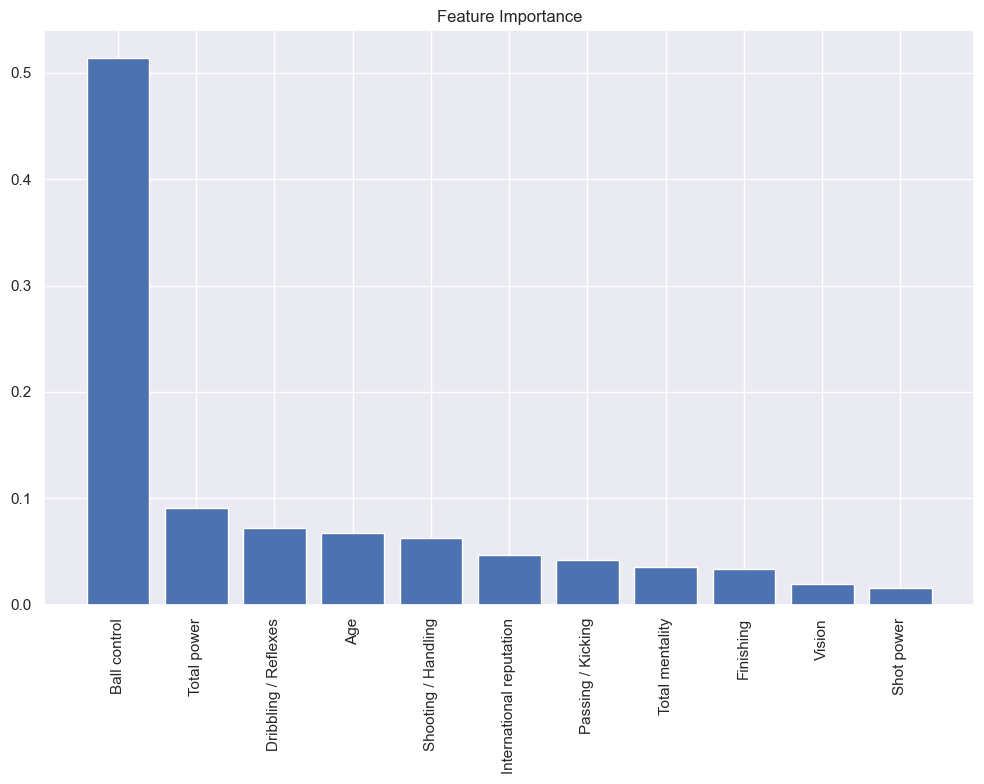

In [ ]:
import matplotlib.pyplot as plt

# Get feature importances
importances = best_model.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

# Plot feature importances
plt.figure(figsize=(10, 8))
plt.title("Feature Importance")
plt.bar(range(X_train.shape[1]), importances[indices], align='center')
plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
plt.tight_layout()
plt.show()
#plt.savefig('feature_importances.png', transparent=True, bbox_inches='tight')

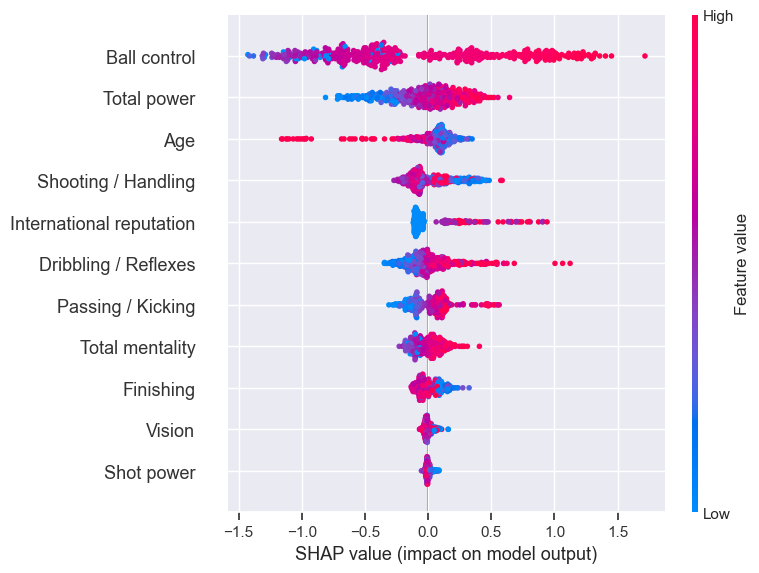

In [ ]:
import shap

# Initialize a SHAP explainer
explainer = shap.Explainer(best_model)

# Calculate SHAP values for a set of instances
shap_values = explainer.shap_values(X_test)

# Visualize SHAP values with a summary plot
shap.summary_plot(shap_values, X_test)


In [ ]:
results = pd.DataFrame({'Real Market Values ($) ': np.exp(y_test), 'Predicted Market Values ($) ': np.exp(y_pred)})

In [ ]:
print(results)

      Real Market Values ($)   Predicted Market Values ($) 
1340               14500000.0                    12500000.0
2042                1600000.0                      750000.0
1563                 950000.0                      600000.0
494                20000000.0                     9000000.0
1838               38500000.0                    11500000.0
...                       ...                           ...
1943                 675000.0                     1300000.0
964                 1500000.0                     1100000.0
2534                3900000.0                      900000.0
2054                 925000.0                      525000.0
372                17000000.0                    15500000.0

[513 rows x 2 columns]


In [ ]:
index_value = 1000
feature_values = log_df.loc[index_value]

for column_name, value in feature_values.items():
    print(f"{column_name}: {value}")

data_player = log_df.iloc[1,1:-1]
data_player.shape

name: C.Ünder
Age: 25
Vision: 78.0
Dribbling / Reflexes: 79
Passing / Kicking: 77
Shooting / Handling: 76
International reputation: 2
Total mentality: 294
Shot power: 80.0
Total power: 338
Ball control: 81.0
Finishing: 74.0
Log Value: 16.34123920227253


(11,)

In [ ]:
input = [{
    "Age": 25,
"Vision": 78.0,
"Dribbling / Reflexes": 79,
"Passing / Kicking": 77,
"Shooting / Handling": 76,
"International reputation": 2,
"Total mentality": 294,
"Shot power": 80.0,
"Total power": 338,
"Ball control": 81.0,
"Finishing": 74.0,
}
]

In [ ]:

id = pd.DataFrame(input)

In [ ]:
id.shape

(1, 11)

In [ ]:

input_arr = id.values

pred_value = best_model.predict(input_arr)
print(f"predicted market value is {round(np.exp(pred_value)[0],2)} ($),  actually value {round(np.exp(log_df.loc[index_value,'Log Value']),2)} ($) ")


predicted market value is 12876649.85 ($),  actually value 12500000.0 ($) 


C:\Users\ollee\anaconda3\envs\dataScience\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
